In [183]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ucimlrepo import fetch_ucirepo 

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error
from sklearn.model_selection import validation_curve

from sklearn.neighbors import KNeighborsRegressor

from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text

from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, RidgeCV, Lasso,LassoCV

from sklearn.decomposition import PCA

import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

np.random.seed(42)
pd.set_option("display.max_colwidth", 120)


Using device: cpu


# 1. DATASET ED E.D.A.

IMPORTO IL DATASET DALLA REPOSITORY DI UCI E VISUALIZZO LA STRUTTURA

In [184]:
infrared_thermography_temperature = fetch_ucirepo(id=925)
X = infrared_thermography_temperature.data.features
y = infrared_thermography_temperature.data.targets



In [185]:
print("--- Prime 2 righe delle features ---")
display(X.head(2))

print("\n--- Dimensioni del dataset (righe, colonne) ---")
display(X.shape)

print("\n--- Informazioni sul dataset (INFO, NULLI E DESCRIZIONE STATISTICA)---")
display(X.info())
display(X.describe())

display(X.isna().sum())

--- Prime 2 righe delle features ---


,Gender,Age,Ethnicity,T_atm,Humidity,Distance,T_offset1,Max1R13_1,Max1L13_1,aveAllR13_1,...,T_FHCC1,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1
0,Male,41-50,White,24.0,28.0,0.8,0.7025,35.03,35.3775,34.40,...,33.5775,33.4775,33.3725,33.4925,33.0025,34.5300,34.0075,35.6925,35.6350,35.6525
1,Female,31-40,Black or African-American,24.0,26.0,0.8,0.7800,34.55,34.5200,33.93,...,34.0325,34.0550,33.6775,33.9700,34.0025,34.6825,34.6600,35.1750,35.0925,35.1075



--- Dimensioni del dataset (righe, colonne) ---


(1020, 33)


--- Informazioni sul dataset (INFO, NULLI E DESCRIZIONE STATISTICA)---
<class 'pandas.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Gender       1020 non-null   str    
 1   Age          1020 non-null   str    
 2   Ethnicity    1020 non-null   str    
 3   T_atm        1020 non-null   float64
 4   Humidity     1020 non-null   float64
 5   Distance     1018 non-null   float64
 6   T_offset1    1020 non-null   float64
 7   Max1R13_1    1020 non-null   float64
 8   Max1L13_1    1020 non-null   float64
 9   aveAllR13_1  1020 non-null   float64
 10  aveAllL13_1  1020 non-null   float64
 11  T_RC1        1020 non-null   float64
 12  T_RC_Dry1    1020 non-null   float64
 13  T_RC_Wet1    1020 non-null   float64
 14  T_RC_Max1    1020 non-null   float64
 15  T_LC1        1020 non-null   float64
 16  T_LC_Dry1    1020 non-null   float64
 17  T_LC_Wet1    1020 non-null   

None

,T_atm,Humidity,Distance,T_offset1,Max1R13_1,Max1L13_1,aveAllR13_1,aveAllL13_1,T_RC1,T_RC_Dry1,...,T_FHCC1,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1
count,1020.000000,1020.000000,1018.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,...,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000,1020.000000
mean,24.115392,28.723039,0.729784,0.968648,35.596533,35.611474,34.888475,35.011345,35.659921,35.587143,...,34.573865,34.567782,34.565340,34.487701,34.577293,35.421555,35.094144,36.084785,35.805519,35.838277
std,1.336338,13.071627,2.456486,0.362587,0.574888,0.549760,0.718613,0.633836,0.553897,0.569278,...,0.672461,0.669410,0.678663,0.668065,0.728678,0.523477,0.576045,0.491821,0.559258,0.559316
min,20.200000,9.900000,0.540000,-0.590000,33.897500,34.122500,31.770000,32.902500,33.985000,33.825000,...,31.050000,31.452500,31.657500,31.280000,31.150000,33.407500,32.440000,34.892500,33.802500,33.835000
25%,23.400000,17.600000,0.600000,0.772500,35.247500,35.271875,34.456250,34.651250,35.332500,35.249375,...,34.213125,34.180000,34.177500,34.096875,34.225000,35.116875,34.756458,35.775000,35.474375,35.500000
50%,24.000000,26.300000,0.620000,0.940000,35.548750,35.575000,34.915000,34.997500,35.602500,35.533750,...,34.605000,34.597500,34.602500,34.512917,34.622500,35.391250,35.100000,36.027500,35.790000,35.825000
75%,24.700000,36.200000,0.700000,1.140000,35.872500,35.883125,35.300000,35.363125,35.910625,35.855625,...,34.965625,34.968125,34.965000,34.878125,35.012500,35.675000,35.415000,36.280000,36.087500,36.120625
max,29.100000,61.200000,79.000000,2.875000,38.405000,38.042500,37.575000,37.680000,38.385000,38.380000,...,37.125000,37.075000,37.165000,37.212500,37.367500,38.002500,37.632500,38.807500,38.417500,38.455000


Gender         0
Age            0
Ethnicity      0
T_atm          0
Humidity       0
Distance       2
T_offset1      0
Max1R13_1      0
Max1L13_1      0
aveAllR13_1    0
aveAllL13_1    0
T_RC1          0
T_RC_Dry1      0
T_RC_Wet1      0
T_RC_Max1      0
T_LC1          0
T_LC_Dry1      0
T_LC_Wet1      0
T_LC_Max1      0
RCC1           0
LCC1           0
canthiMax1     0
canthi4Max1    0
T_FHCC1        0
T_FHRC1        0
T_FHLC1        0
T_FHBC1        0
T_FHTC1        0
T_FH_Max1      0
T_FHC_Max1     0
T_Max1         0
T_OR1          0
T_OR_Max1      0
dtype: int64

Nella visualizzazione ci accorgiamo che sono presenti 3 colonne di tipo categorico e 30 di tipo continuo, per un totale di 33. Si rilevo nella colonna relativa alle distanze (Distance), due dati nulli. La distanza delle misurazioni nell'esperimento, come vedremo in seguito dagli istogrammi della popolazione del dataset, è fisso a 1m. Tuttavia, non sapendo perchè la registrazione del dato è errata, in abbondanza di campioni (1020), si è deciso di rimuoverli.
Si è proceduto a fare encoding delle 3 colonne di tipo categorico.
Tramite il preprocessor si sono generate:
- 1 colonna age in cui venivano numerate le fasce d'età in ordine crescente
- 1 colonna per ogni genere ed etnia di tipo booleano (scelta fatta in assenza di una cardinalità delle seguenti categorie).
Le colonne prodotte per genere sono state ridotte solo a una colonna Female (booleana), dato che la colonna Male sarebbe risultata ridondante.
Le colonne prodotte per etnia sono state rinominate con nomi piu indicativi e di facile comprensione.   {RIVEDI age prima riga transformer}

In [186]:
preprocessor = ColumnTransformer(
    transformers=[
        ('age', OrdinalEncoder(), ['Age']),
        ('cat', OneHotEncoder(sparse_output=False, drop='first'), ['Gender', 'Ethnicity'])
    ],
    remainder='passthrough'
)

# 3. Trasformazione
X_trasformato = preprocessor.fit_transform(X)
nomi_colonne = preprocessor.get_feature_names_out()

df = pd.DataFrame(X_trasformato, columns=nomi_colonne)

mapping = {
    'cat__Gender_Female': 'Female',
    'age__Age': 'Fascia_Eta',
    'cat__Ethnicity_American Indian or Alaskan Native':'American_Indian/Alaskan_Native',
    'cat__Ethnicity_Asian':'Asian',
    'cat__Ethnicity_Black or African-American':'Black/African_American',
    'cat__Ethnicity_Hispanic/Latino':'Hispanic/Latino',
    'cat__Ethnicity_Multiracial':'Multiracial',
    'cat__Ethnicity_White':'White'
}
df = df.rename(columns=mapping)
df.columns = [col.replace('remainder__', '') for col in df.columns]

if 'cat__Gender_Male' in df.columns:
    df.drop(columns=['cat__Gender_Male'], inplace=True)

display(df.head())

,Fascia_Eta,Asian,Black/African_American,Hispanic/Latino,Multiracial,White,T_atm,Humidity,Distance,T_offset1,...,T_FHCC1,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1
0,5.0,0.0,0.0,0.0,0.0,1.0,24.0,28.0,0.8,0.7025,...,33.5775,33.4775,33.3725,33.4925,33.0025,34.5300,34.0075,35.6925,35.6350,35.6525
1,4.0,0.0,1.0,0.0,0.0,0.0,24.0,26.0,0.8,0.7800,...,34.0325,34.0550,33.6775,33.9700,34.0025,34.6825,34.6600,35.1750,35.0925,35.1075
2,2.0,0.0,0.0,0.0,0.0,1.0,24.0,26.0,0.8,0.8625,...,34.9000,34.8275,34.6475,34.8200,34.6700,35.3450,35.2225,35.9125,35.8600,35.8850
3,2.0,0.0,1.0,0.0,0.0,0.0,24.0,27.0,0.8,0.9300,...,34.4400,34.4225,34.6550,34.3025,34.9175,35.6025,35.3150,35.7200,34.9650,34.9825
4,0.0,0.0,0.0,0.0,0.0,1.0,24.0,27.0,0.8,0.8950,...,35.0900,35.1600,34.3975,34.6700,33.8275,35.4175,35.3725,35.8950,35.5875,35.6175


Dal paper ("Facial and oral temperature data from a large set of human subject volunteers", doi = {10.13026/3bhc-9065}) leggiamo come le temperature misurate con contatto termometria orale a contatto sono effettuate con due tempistiche e modalità differenti, una lunga e una veloce. La aveOralM, dato della misurazione piu lunga risulta piu accaurato, procediamo quindi ad usarlo come label e ad escludere la colonna aveOralF.
Dividiamo il dataset completo nel vettore delle label (y) e nel vettore delle feature (X).

In [187]:
print("--- Prime 5 righe delle OBJECTIVE ---")
display(y.head())

print("\n--- Dimensioni del dataset (righe, colonne) ---")
display(y.shape)

print("\n--- Informazioni sul dataset ---")
display(y.info())
display(y.isna().sum())
display(y.describe())
y = y['aveOralM']
display(y.head())

df['aveOralM'] = y

df.head(1)
df = df.dropna()
display(df.describe())
display(df.info())

--- Prime 5 righe delle OBJECTIVE ---


,aveOralF,aveOralM
0,36.85,36.59
1,37.00,37.19
2,37.20,37.34
3,36.85,37.09
4,36.80,37.04



--- Dimensioni del dataset (righe, colonne) ---


(1020, 2)


--- Informazioni sul dataset ---
<class 'pandas.DataFrame'>
RangeIndex: 1020 entries, 0 to 1019
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   aveOralF  1020 non-null   float64
 1   aveOralM  1020 non-null   float64
dtypes: float64(2)
memory usage: 16.1 KB


None

aveOralF    0
aveOralM    0
dtype: int64

,aveOralF,aveOralM
count,1020.000000,1020.000000
mean,36.979216,37.028382
std,0.386403,0.509502
min,35.750000,35.540000
25%,36.800000,36.777500
50%,36.900000,36.940000
75%,37.100000,37.140000
max,39.600000,40.340000


0    36.59
1    37.19
2    37.34
3    37.09
4    37.04
Name: aveOralM, dtype: float64

,Fascia_Eta,Asian,Black/African_American,Hispanic/Latino,Multiracial,White,T_atm,Humidity,Distance,T_offset1,...,T_FHRC1,T_FHLC1,T_FHBC1,T_FHTC1,T_FH_Max1,T_FHC_Max1,T_Max1,T_OR1,T_OR_Max1,aveOralM
count,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,...,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000
mean,0.817289,0.255403,0.140472,0.055992,0.049116,0.495088,24.115815,28.749411,0.729784,0.968991,...,34.568583,34.565945,34.488836,34.578310,35.422130,35.094648,36.084615,35.805225,35.837984,37.028163
std,1.247225,0.436302,0.347646,0.230020,0.216216,0.500222,1.337617,13.070900,2.456486,0.362860,...,0.669346,0.678941,0.667293,0.728353,0.523703,0.576283,0.492236,0.559755,0.559812,0.509743
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.200000,9.900000,0.540000,-0.590000,...,31.452500,31.657500,31.280000,31.150000,33.407500,32.440000,34.892500,33.802500,33.835000,35.540000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.400000,17.600000,0.600000,0.772500,...,34.181250,34.178125,34.097500,34.226875,35.118750,34.758125,35.775000,35.473125,35.500000,36.752500
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,26.300000,0.620000,0.940000,...,34.597500,34.602500,34.512917,34.622500,35.392500,35.100000,36.027500,35.788750,35.825000,36.940000
75%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,24.700000,36.200000,0.700000,1.140000,...,34.969375,34.965000,34.879375,35.012500,35.675000,35.415000,36.280000,36.087500,36.121875,37.140000
max,7.000000,1.000000,1.000000,1.000000,1.000000,1.000000,29.100000,61.200000,79.000000,2.875000,...,37.075000,37.165000,37.212500,37.367500,38.002500,37.632500,38.807500,38.417500,38.455000,40.340000


<class 'pandas.DataFrame'>
Index: 1018 entries, 0 to 1019
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Fascia_Eta              1018 non-null   float64
 1   Asian                   1018 non-null   float64
 2   Black/African_American  1018 non-null   float64
 3   Hispanic/Latino         1018 non-null   float64
 4   Multiracial             1018 non-null   float64
 5   White                   1018 non-null   float64
 6   T_atm                   1018 non-null   float64
 7   Humidity                1018 non-null   float64
 8   Distance                1018 non-null   float64
 9   T_offset1               1018 non-null   float64
 10  Max1R13_1               1018 non-null   float64
 11  Max1L13_1               1018 non-null   float64
 12  aveAllR13_1             1018 non-null   float64
 13  aveAllL13_1             1018 non-null   float64
 14  T_RC1                   1018 non-null   float64
 15  T_R

None

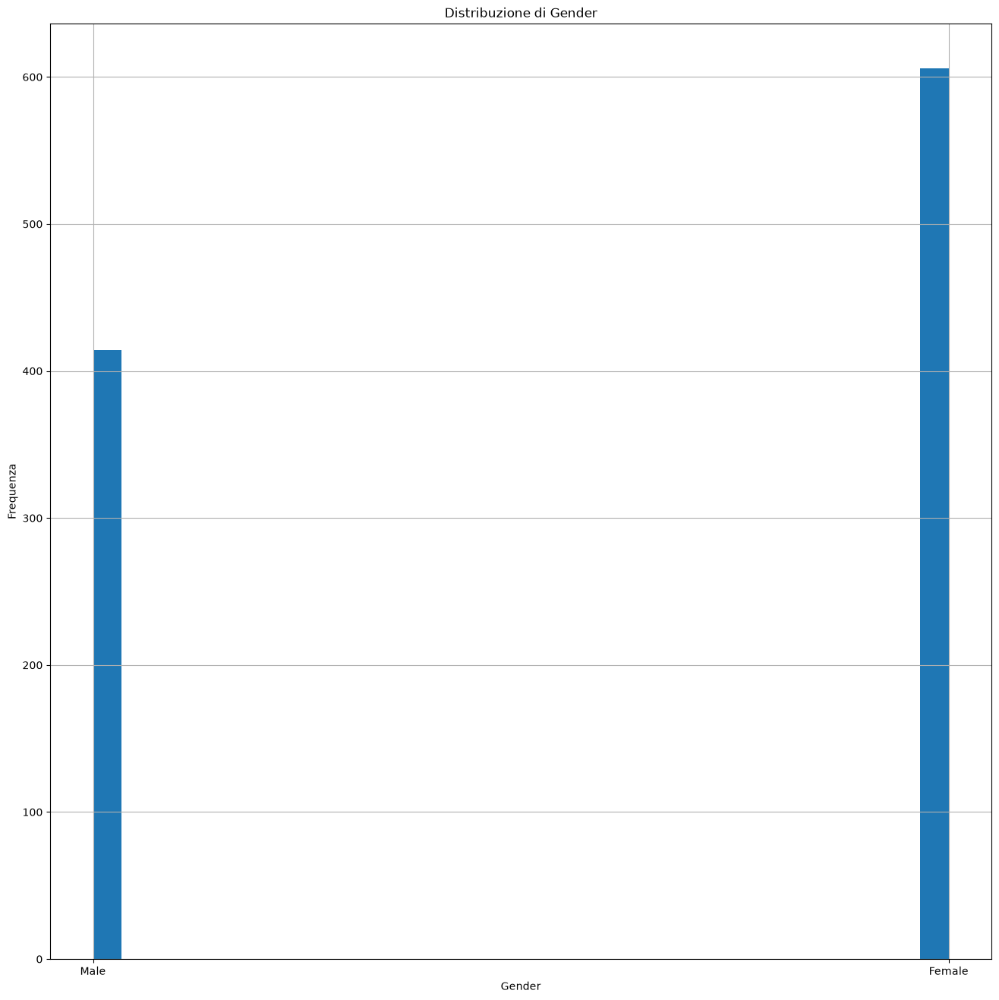

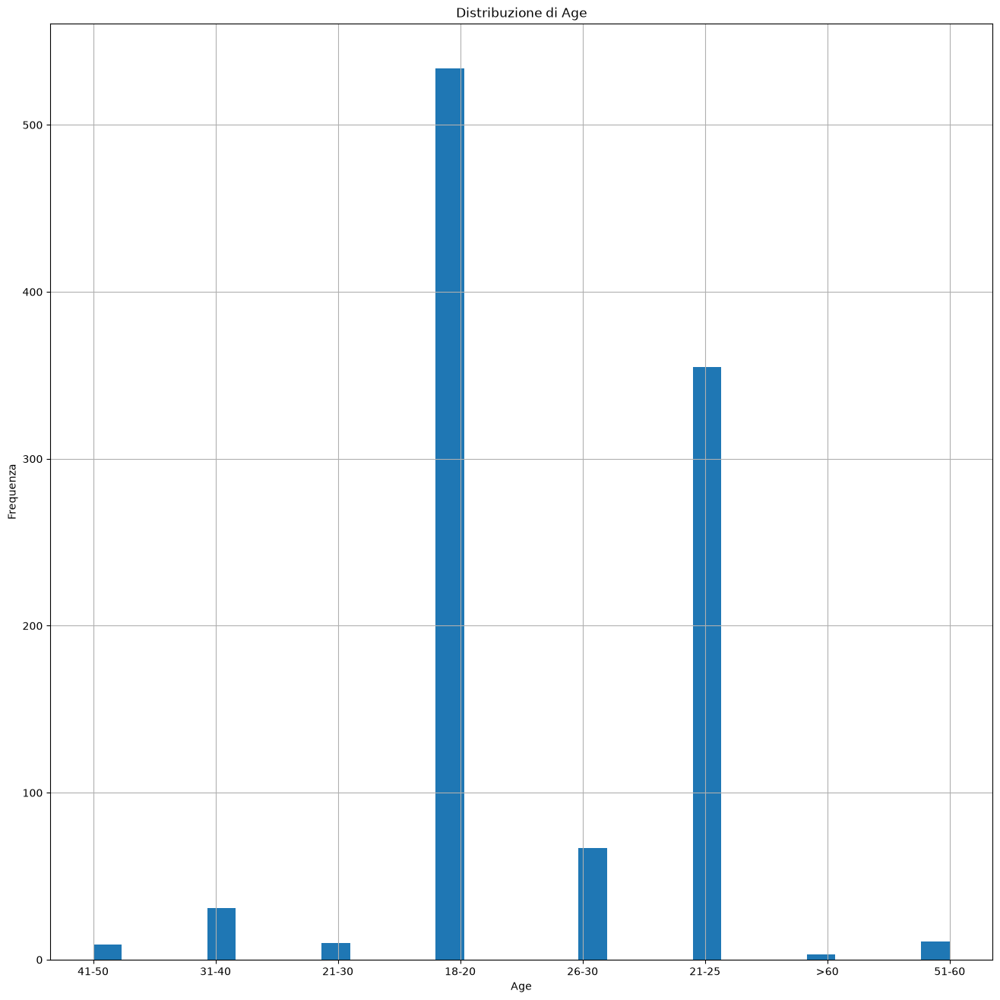

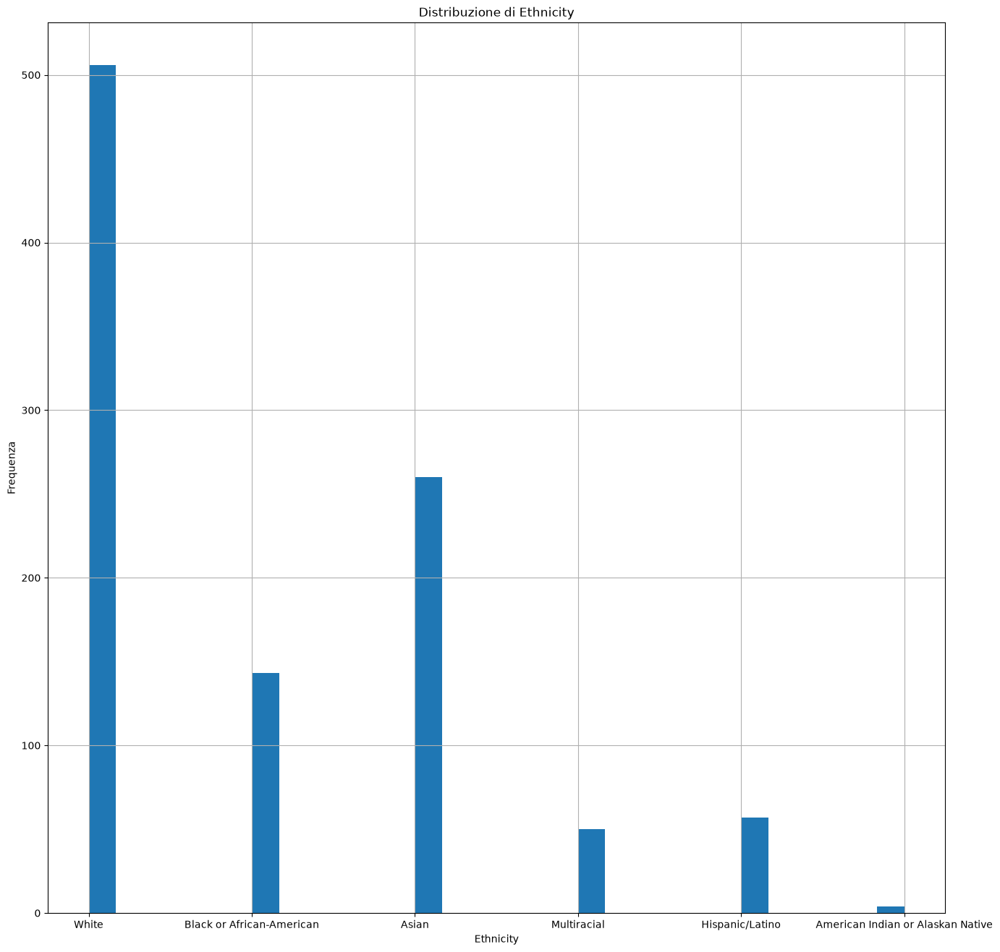

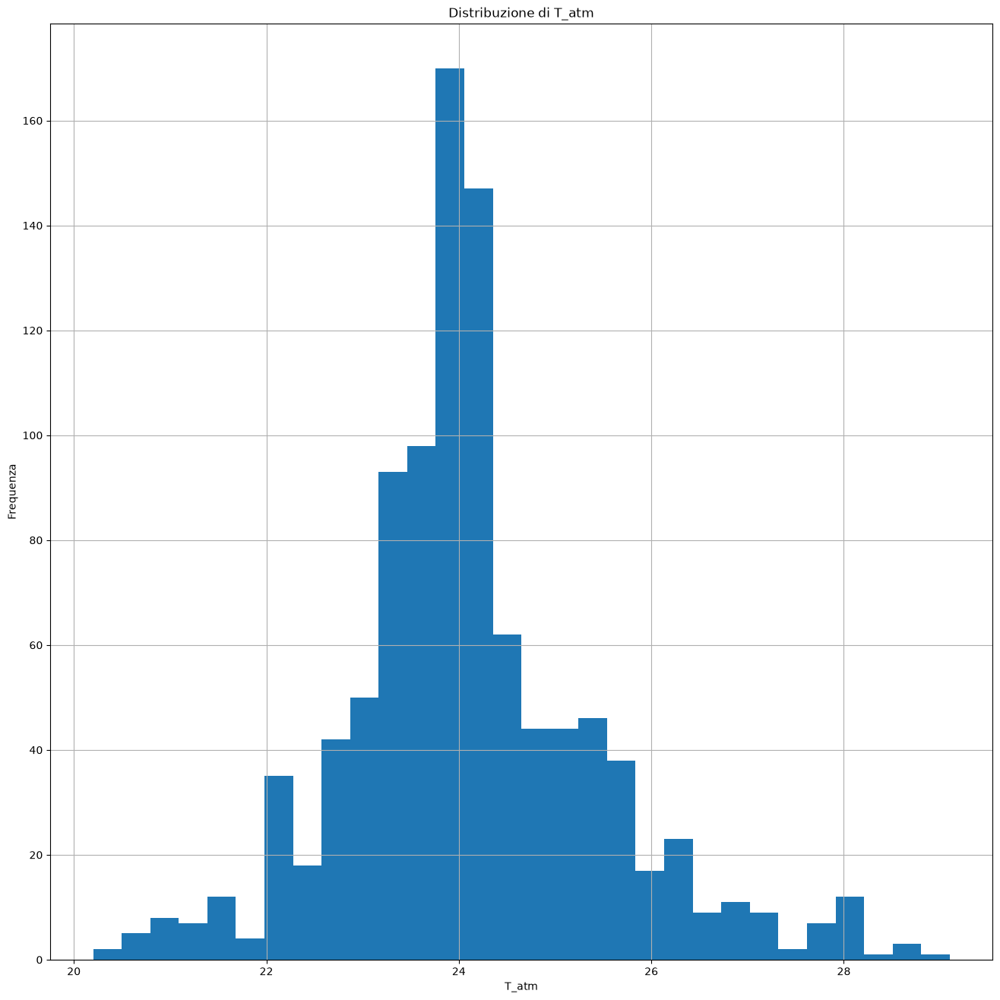

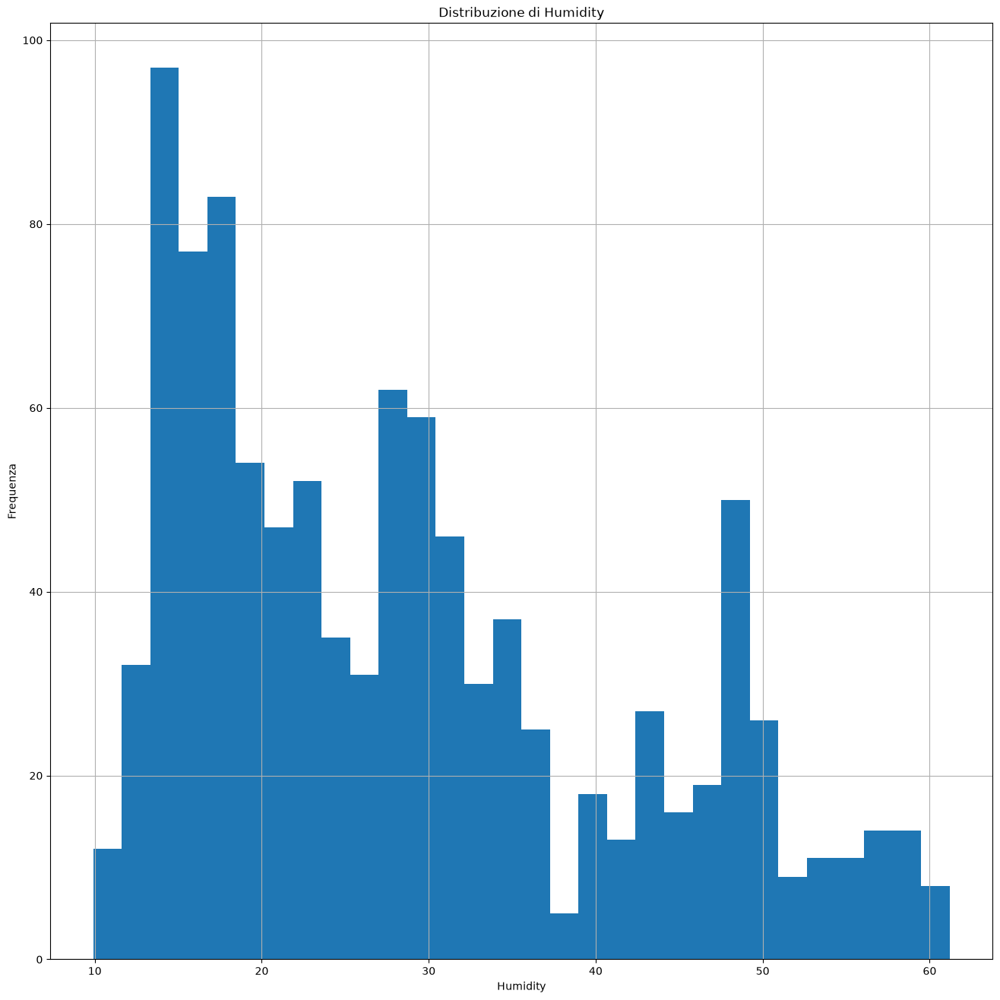

...

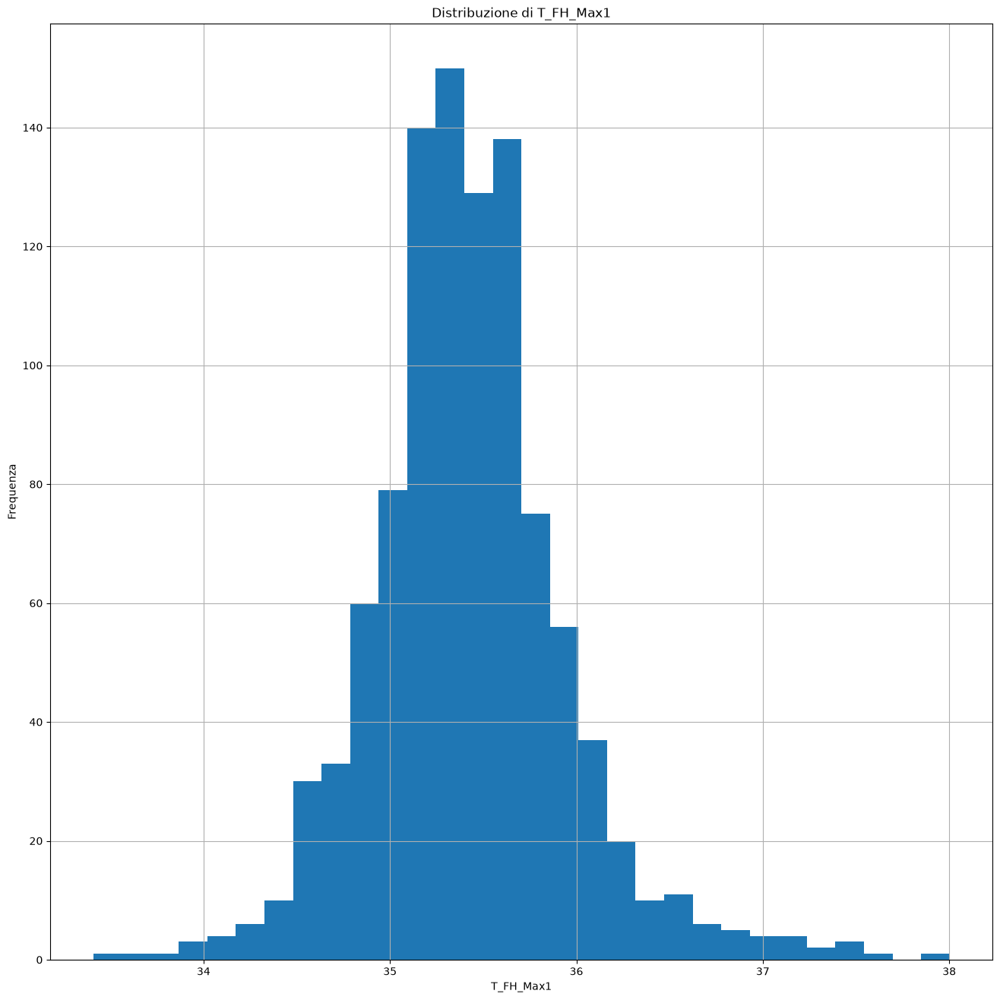

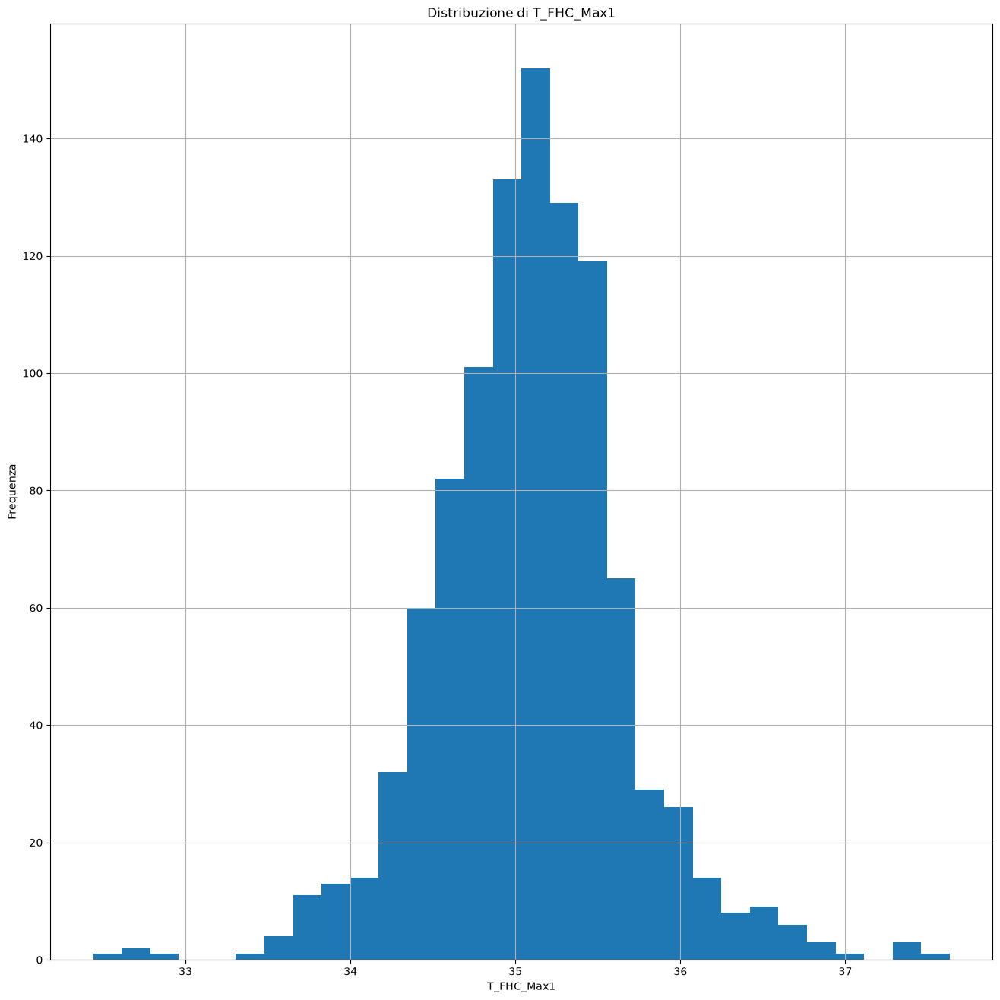

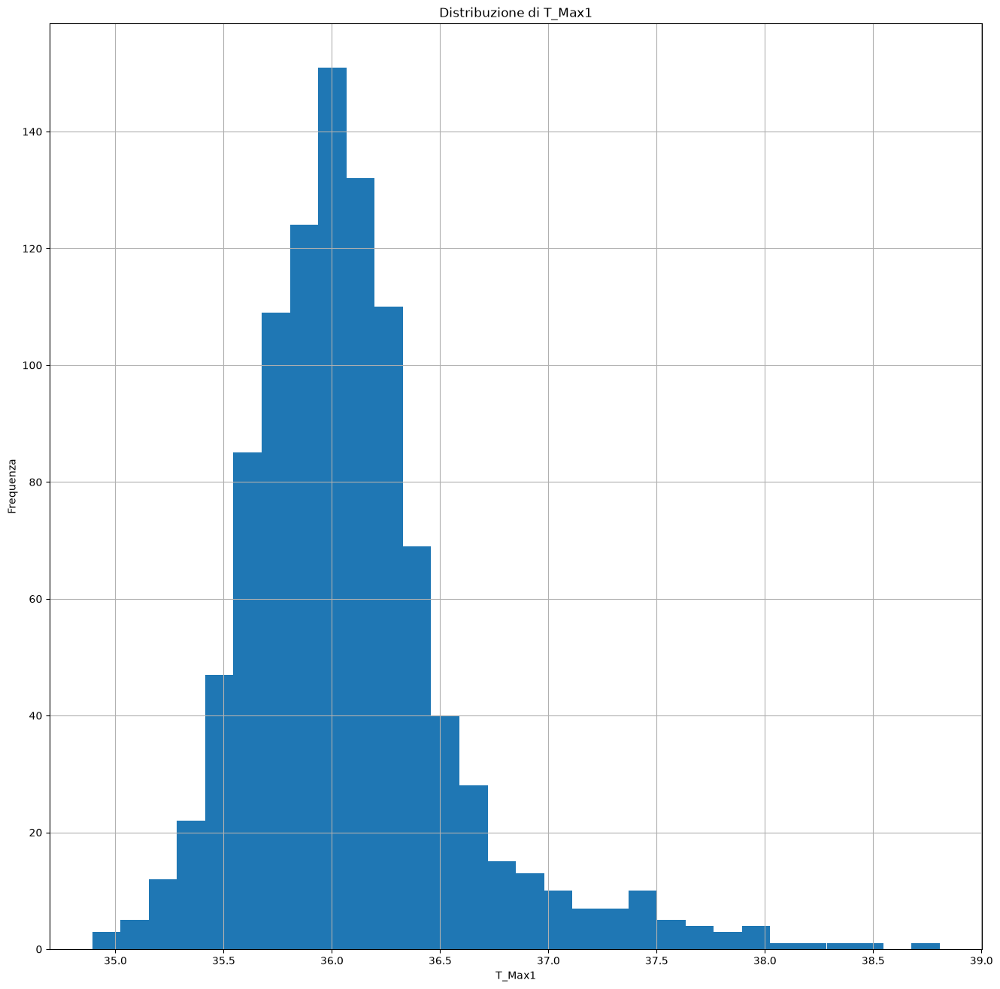

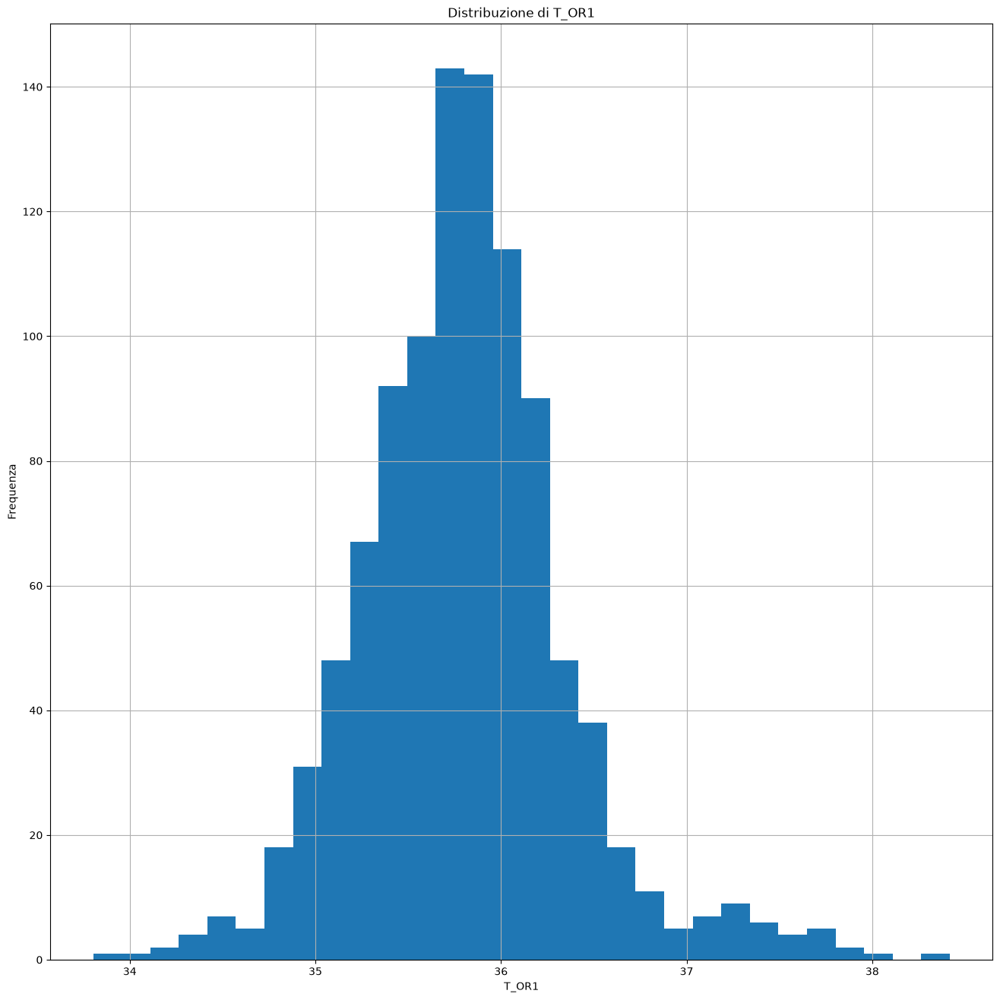

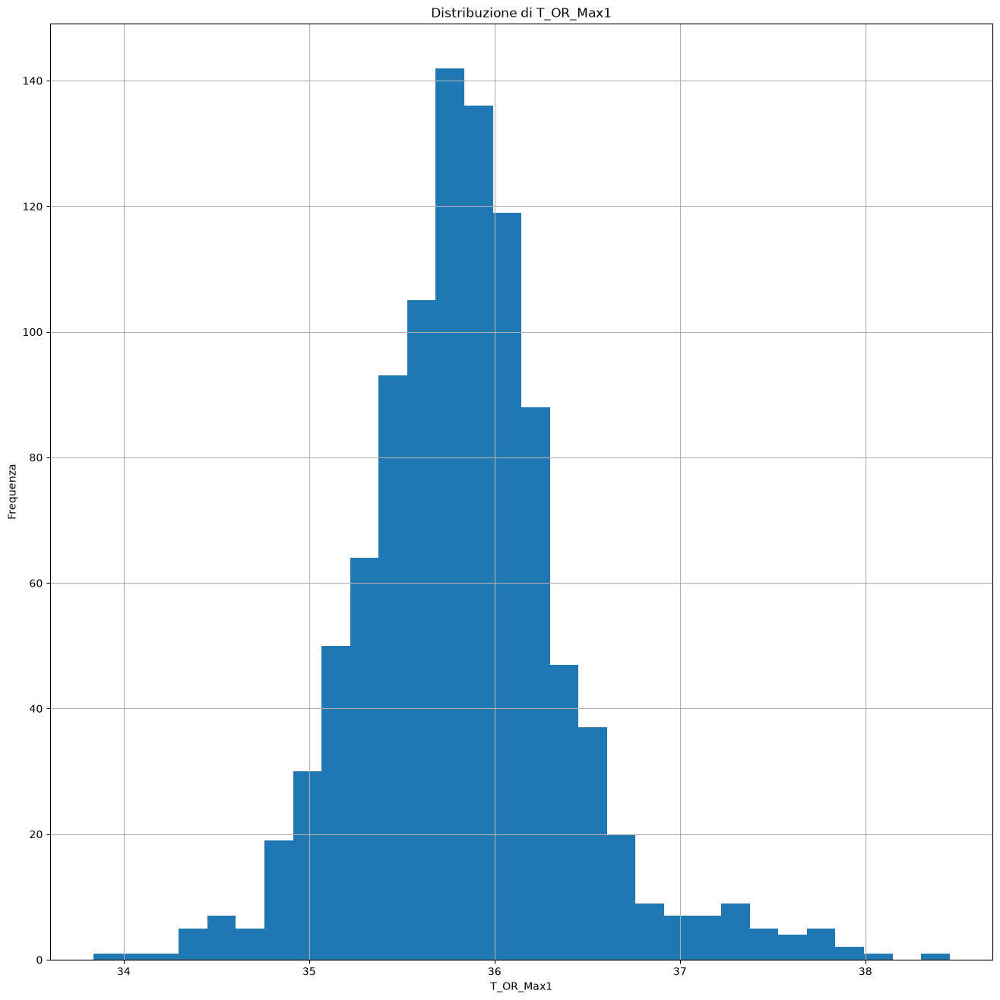

In [188]:
for col in X.columns:
    plt.figure(figsize=(16, 16))
    X[col].hist(bins=30)
    plt.title(f"Distribuzione di {col}")
    plt.xlabel(col); plt.ylabel("Frequenza")
    plt.show()


Osservo che la distanza delle misurazioni è unica e standard, procedo quindi ad eliminare la feature distance dal dataset perche non rilevante.
Noto che le popolazioni sono tutte gaussiane, quindi si procede alla standardizzazione delle feature continue. 

In [189]:
df.drop(columns="Distance", inplace=True)
'''
cols_to_scale =[
    "T_atm", "Humidity", "T_offset1", "Max1R13_1", 
    "Max1L13_1", "aveAllR13_1", "aveAllL13_1", "T_RC1", "T_RC_Dry1", 
    "T_RC_Wet1", "T_RC_Max1", "T_LC1", "T_LC_Dry1", "T_LC_Wet1", 
    "T_LC_Max1", "RCC1", "LCC1", "canthiMax1", "canthi4Max1", 
    "T_FHCC1", "T_FHRC1", "T_FHLC1", "T_FHBC1", "T_FHTC1", 
    "T_FH_Max1", "T_FHC_Max1", "T_Max1", "T_OR1", "T_OR_Max1", 
    "aveOralM"
]
print(len(cols_to_scale))
scaler = StandardScaler()
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])'''

'\ncols_to_scale =[\n    "T_atm", "Humidity", "T_offset1", "Max1R13_1", \n    "Max1L13_1", "aveAllR13_1", "aveAllL13_1", "T_RC1", "T_RC_Dry1", \n    "T_RC_Wet1", "T_RC_Max1", "T_LC1", "T_LC_Dry1", "T_LC_Wet1", \n    "T_LC_Max1", "RCC1", "LCC1", "canthiMax1", "canthi4Max1", \n    "T_FHCC1", "T_FHRC1", "T_FHLC1", "T_FHBC1", "T_FHTC1", \n    "T_FH_Max1", "T_FHC_Max1", "T_Max1", "T_OR1", "T_OR_Max1", \n    "aveOralM"\n]\nprint(len(cols_to_scale))\nscaler = StandardScaler()\ndf[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])'

In [190]:
corr = df.corr(numeric_only=True)
target_corr = corr["aveOralM"].sort_values(ascending=False)
target_corr

aveOralM                  1.000000
T_Max1                    0.849684
canthiMax1                0.784564
canthi4Max1               0.784227
T_RC_Max1                 0.769876
T_RC1                     0.769145
T_OR1                     0.767483
T_OR_Max1                 0.767039
T_RC_Wet1                 0.760433
T_LC_Max1                 0.750764
T_LC1                     0.750653
T_RC_Dry1                 0.749038
T_LC_Dry1                 0.743938
Max1R13_1                 0.742377
Max1L13_1                 0.735877
T_LC_Wet1                 0.720585
RCC1                      0.714478
LCC1                      0.696868
aveAllL13_1               0.648076
T_FH_Max1                 0.643324
aveAllR13_1               0.622122
T_FHC_Max1                0.597136
T_FHBC1                   0.555814
T_FHRC1                   0.516528
T_FHCC1                   0.515826
T_FHLC1                   0.465108
T_FHTC1                   0.457395
T_offset1                 0.139412
T_atm               

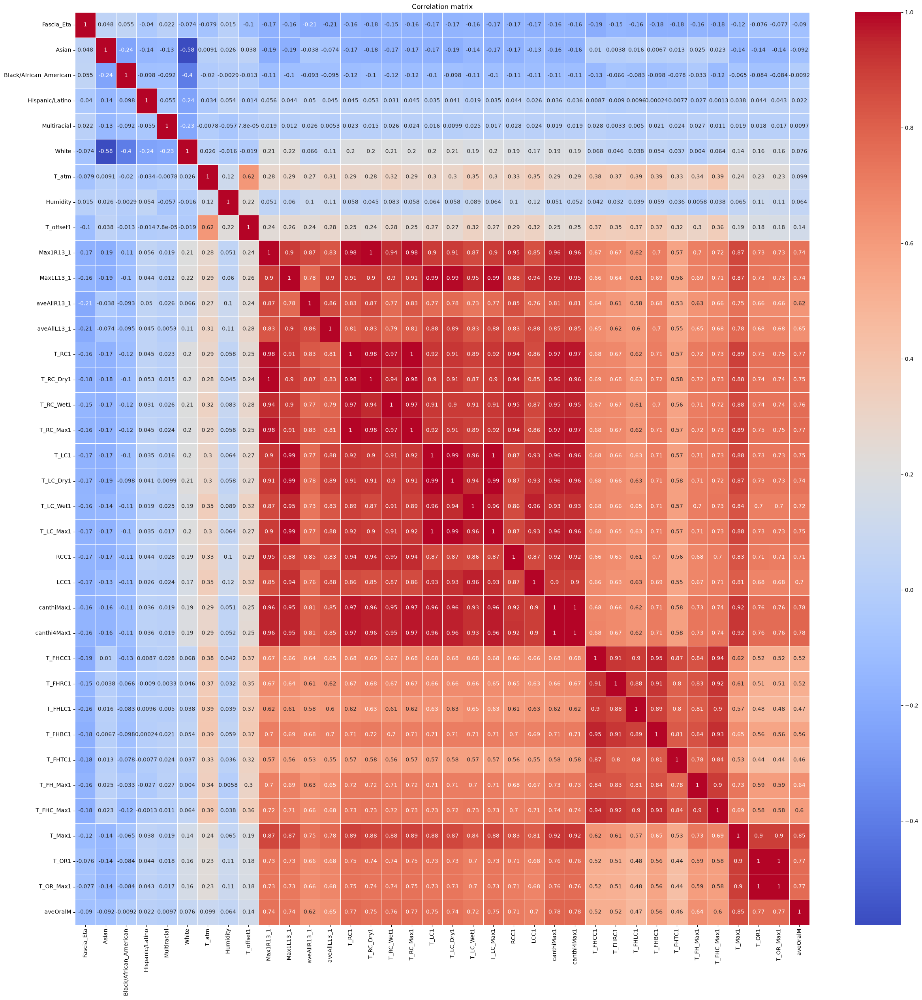

In [191]:
plt.figure(figsize=(30, 30))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation matrix')
plt.show()

Le feature relative alla misurazione della temperatura, come auspicabile, sono tra loro molto correlate (maggiormente se esse sono relative alle stesse zone facciali designate), inoltre, la Tmax registrata sulla faccia è forse la feature più indicativa, avendo una altissima correlazione con la Tobiettivo. 
Siccome la correlazione tra le feature puo rendere instabili i modelli, sopratutto di regressione, e, in generale, complicarne la computazione, mantengo le feature che registrano la media dei 4 pixel con temperatura piu elevata in quel distretto. La decisione è stata presa seguendo due morivazioni:
- per la legge secondo cui la media su una popolazione abbassa la deviazione standard con la radice del numero dei campioni che compongono la media (in questo caso std/2);
- le temperature massime sono quelle con maggiore correlazione con la label.

In [192]:
cols_to_drop = [
    "Max1R13_1", "Max1L13_1", "aveAllR13_1", "aveAllL13_1","T_RC_Dry1", "T_RC_Wet1", "T_RC_Max1",
    "T_LC_Dry1", "T_LC_Wet1","T_LC_Max1", 
    "RCC1", "LCC1","canthiMax1",
    "T_OR_Max1",
    ]
 
df.drop(columns=cols_to_drop, inplace=True)

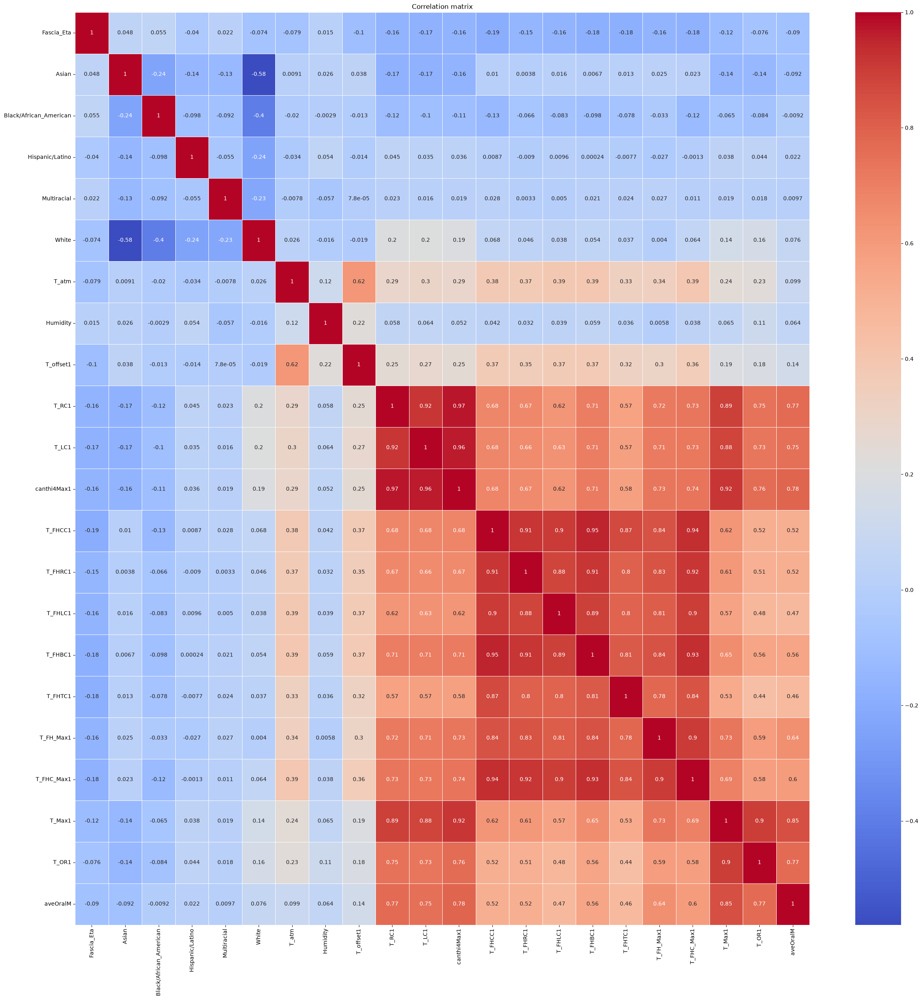

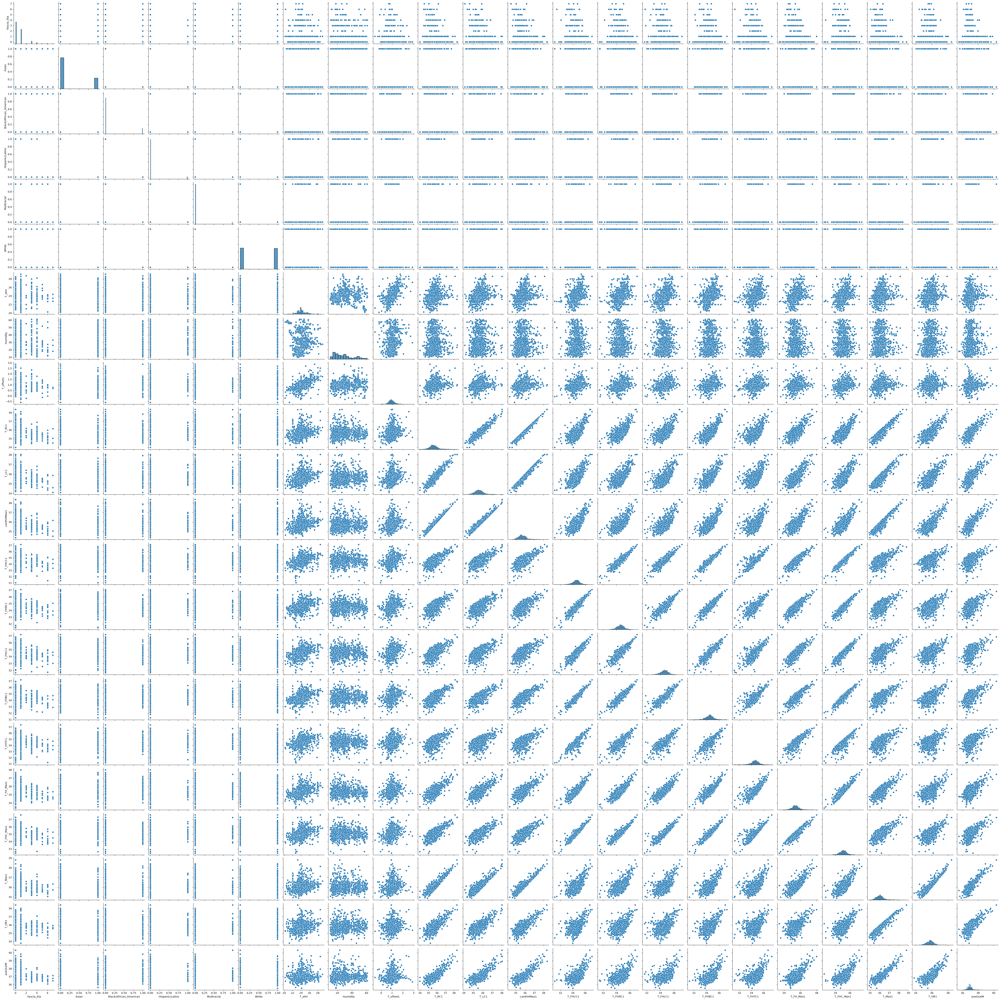

In [193]:
plt.figure(figsize=(30, 30))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation matrix')
plt.show()

sns.pairplot(df)


## 2. Train/Test split


In [ ]:
X = df.drop(columns=['aveOralM'])
y = df['aveOralM']

cols_to_scale =[
    "T_atm", "Humidity", "T_offset1",
    "T_RC1", 
    "T_LC1",
    "canthi4Max1", 
    "T_FHCC1", "T_FHRC1", "T_FHLC1", "T_FHBC1", "T_FHTC1", 
    "T_FH_Max1", "T_FHC_Max1", 
    "T_Max1", 
    "T_OR1"
]

scaler = StandardScaler()
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42
)
X_train[cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])
X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

In [ ]:


X_train.shape, X_test.shape,X.head()

((763, 21),
 (255, 21),
    Fascia_Eta  Asian  Black/African_American  Hispanic/Latino  Multiracial  \
 0         5.0    0.0                     0.0              0.0          0.0   
 1         4.0    0.0                     1.0              0.0          0.0   
 2         2.0    0.0                     0.0              0.0          0.0   
 3         2.0    0.0                     1.0              0.0          0.0   
 4         0.0    0.0                     0.0              0.0          0.0   
 
    White     T_atm  Humidity  T_offset1     T_RC1  ...  canthi4Max1   T_FHCC1  \
 0    1.0 -0.086626 -0.057362  -0.734781 -1.217816  ...    -0.788366 -1.484684   
 1    0.0 -0.086626 -0.210449  -0.521095 -1.714056  ...    -1.955040 -0.807446   
 2    1.0 -0.086626 -0.210449  -0.293623  0.045340  ...    -0.141775  0.483770   
 3    0.0 -0.086626 -0.133906  -0.107509 -0.816313  ...    -0.305766 -0.200909   
 4    1.0 -0.086626 -0.133906  -0.204012 -0.103532  ...    -0.207371  0.766573   
 
     T

# 3. MODELLI E CONFRONTO

## K-NN

Per la scelta dei modelli il primo usato e messo a confronto è stato il K-NN i cui iperparametri sono stati valutati con GridSearch.

In [196]:
pipe_knn = Pipeline([("knn", KNeighborsRegressor())])
param_range = list(range(1, 31, 6))
param_grid_knn = {
    "knn__n_neighbors": param_range,
    "knn__weights": ["uniform", "distance"],
    "knn__metric": ["euclidean", "manhattan"]
}
gs_knn = GridSearchCV(
    pipe_knn, param_grid_knn, cv=5, n_jobs=-1,
    scoring="neg_mean_squared_error", refit=True,
    error_score='raise'

)
gs_knn.fit(X_train, y_train)

print("Migliori iperparametri:", gs_knn.best_params_)
print("CV RMSE (best):", (-gs_knn.best_score_)**0.5)

Migliori iperparametri: {'knn__metric': 'euclidean', 'knn__n_neighbors': 13, 'knn__weights': 'distance'}
CV RMSE (best): 0.27899413373381


## Funzione per visualizzazione curva di validazione (generalization gap)

In [197]:
def curvaValidazione(pipe, X_train, y_train, param_name,param_range,scoring,TITLE, XLABEL,YLABEL,reverse,log_scale):
    train_scores, test_scores = validation_curve(
        pipe, X_train, y_train, 
        param_name=param_name, 
        param_range = param_range,
        scoring=scoring, 
        cv=5, n_jobs=-1
    )

    # Convertiamo gli score in RMSE (dato che la scoring è negativa)
    train_rmse = np.sqrt(-train_scores)
    test_rmse = np.sqrt(-test_scores)

    # Calcolo medie e deviazioni standard
    train_mean = np.mean(train_rmse, axis=1)
    train_std = np.std(train_rmse, axis=1)
    test_mean = np.mean(test_rmse, axis=1)
    test_std = np.std(test_rmse, axis=1)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(param_range, train_mean, label="Training score (RMSE)", color="blue", marker='o')
    plt.plot(param_range, test_mean, label="Cross-validation score (RMSE)", color="red", marker='o')

    plt.title(TITLE)
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)
    plt.legend(loc="best")
    plt.grid(True)
    if reverse:
        plt.gca().invert_xaxis()
    if log_scale:    
        plt.xscale('log')
    plt.show()

VISUALIZZAZIONE DELLA CURVA DI VALIDAZIONE PER ACCERTARE LA SCELTA DEL PARAMETRO

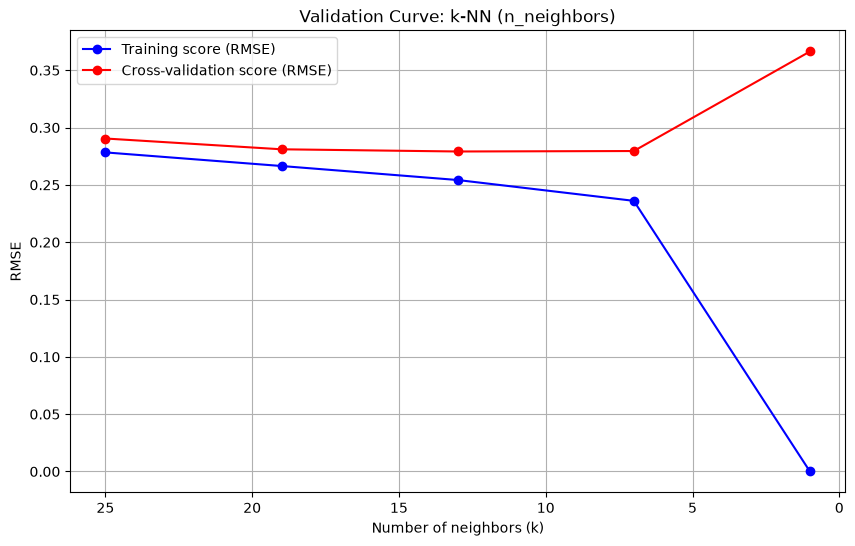

In [198]:
curvaValidazione(pipe_knn, X_train, y_train, "knn__n_neighbors",param_range,"neg_mean_squared_error","Validation Curve: k-NN (n_neighbors)","Number of neighbors (k)","RMSE",1,0)

In [199]:
# Test
y_pred_knn = gs_knn.predict(X_test)
rmse_knn = mean_squared_error(y_test, y_pred_knn)**0.5
mae_knn  = mean_absolute_error(y_test, y_pred_knn)
r2_knn   = r2_score(y_test, y_pred_knn)

print(f"Test RMSE (k-NN): {rmse_knn:.4f}")
print(f"Test MAE  (k-NN): {mae_knn:.4f}")
print(f"Test R^2  (k-NN): {r2_knn:.4f}")

Test RMSE (k-NN): 0.2529
Test MAE  (k-NN): 0.1910
Test R^2  (k-NN): 0.6930


## Decision Tree

In [200]:
dt = DecisionTreeRegressor(random_state=42)
param_grid_dt = {
    "criterion": ["absolute_error"],
    "max_depth": [None, 1,2,3,4,5,6,7,8,9,10],
    "min_samples_leaf": [1, 2, 5]
}
gs_dt = GridSearchCV(
    dt, param_grid_dt, cv=5, n_jobs=-1,
    scoring="neg_mean_squared_error", refit=True
)
gs_dt.fit(X_train, y_train)

print("Migliori iperparametri:", gs_dt.best_params_)
print("CV RMSE (best):", (-gs_dt.best_score_)**0.5)

Migliori iperparametri: {'criterion': 'absolute_error', 'max_depth': 3, 'min_samples_leaf': 1}
CV RMSE (best): 0.28264184232648865


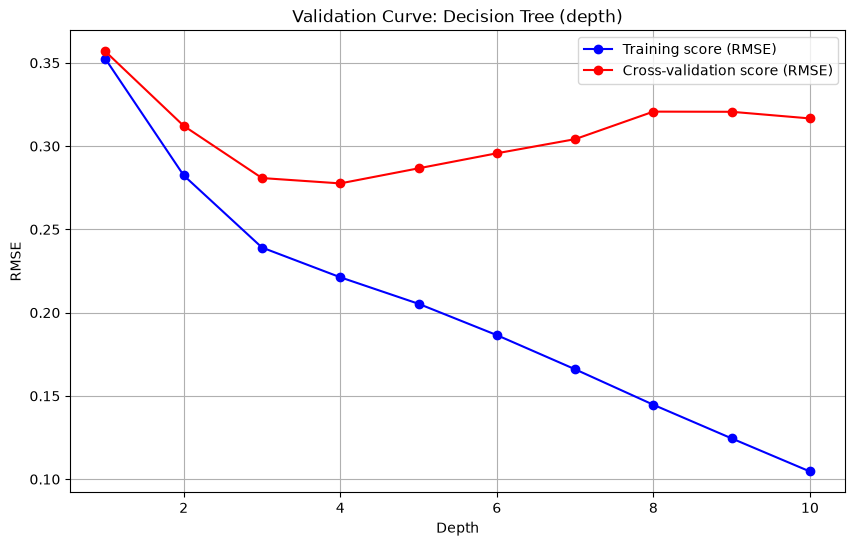

In [201]:
curvaValidazione(dt, X_train, y_train, "max_depth",[None, 1,2,3,4,5,6,7,8,9,10],"neg_mean_squared_error","Validation Curve: Decision Tree (depth)","Depth","RMSE",0,0)

In [202]:

# Test
y_pred_dt = gs_dt.predict(X_test)
rmse_dt = mean_squared_error(y_test, y_pred_dt)**0.5
mae_dt  = mean_absolute_error(y_test, y_pred_dt)
r2_dt   = r2_score(y_test, y_pred_dt)

print(f"Test RMSE (DT): {rmse_dt:.4f}")
print(f"Test MAE  (DT): {mae_dt:.4f}")
print(f"Test R^2  (DT): {r2_dt:.4f}")


Test RMSE (DT): 0.2636
Test MAE  (DT): 0.2031
Test R^2  (DT): 0.6664


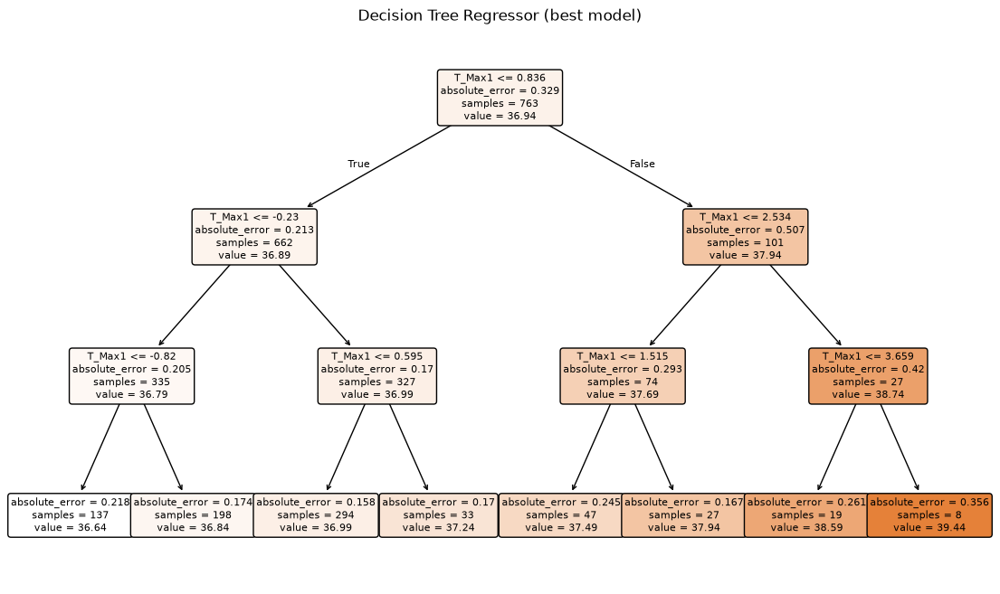

In [203]:
# Tree diagram
best_dt = gs_dt.best_estimator_
plt.figure(figsize=(14, 8))
plot_tree(best_dt, feature_names=X.columns, filled=True, rounded=True)
plt.title("Decision Tree Regressor (best model)")
plt.show()


## REGRESSIONE LINEARE

In [204]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
y_pred_lr = model_lr.predict(X_test)

rmse_lr = mean_squared_error(y_test, y_pred_lr)**0.5
mae_lr  = mean_absolute_error(y_test, y_pred_lr)
r2_lr   = r2_score(y_test, y_pred_lr)

# 5. Valutazione
print(f"Coefficienti: {model_lr.coef_}")
print(f"Intercetta: {model_lr.intercept_}")
print(f"____________________________________________________________")
print(f"Test RMSE (DT): {rmse_lr:.4f}")
print(f"Test MAE  (DT): {mae_lr:.4f}")
print(f"Test R^2  (DT): {r2_lr:.4f}")
print(f"Errore Quadratico Medio (MSE): {mean_squared_error(y_test, y_pred_lr)}")

Coefficienti: [ 0.00842122  0.13260733  0.16232749  0.04982384  0.09574926  0.07763825
 -0.08769386  0.00946552  0.03600299  0.06087589  0.03470435 -0.01764717
 -0.10434999 -0.00332093 -0.07942961  0.03785637  0.01953628  0.0570099
  0.09472425  0.33120804  0.0334694 ]
Intercetta: 36.914838249675526
____________________________________________________________
Test RMSE (DT): 0.2533
Test MAE  (DT): 0.1974
Test R^2  (DT): 0.6920
Errore Quadratico Medio (MSE): 0.06417356504281492


## PLOT ACCURACY PREDICTION VISUALIZATION

In [205]:
def plot_risultati(y_true, y_pred,TITLE):
    plt.figure(figsize=(8, 6))
    
    # Scatter plot dei valori reali (Verde) e predetti (Rosso)
    # Nota: mettiamo i reali in asse X e predetti in Y per vedere la diagonale
    plt.scatter(y_true, y_pred, color='red', alpha=0.5, label='Predizioni')
    
    # Linea ideale (dove y_true == y_pred)
    lims = [
        np.min([y_true.min(), y_pred.min()]),
        np.max([y_true.max(), y_pred.max()]),
    ]
    plt.plot(lims, lims, color='green', linestyle='--', label='Linea ideale (y_true = y_pred)')
    
    plt.xlabel('Valori Reali (y_true)')
    plt.ylabel('Valori Predetti (y_pred)')
    plt.title(f'Confronto Valori Reali vs Predetti {TITLE}')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

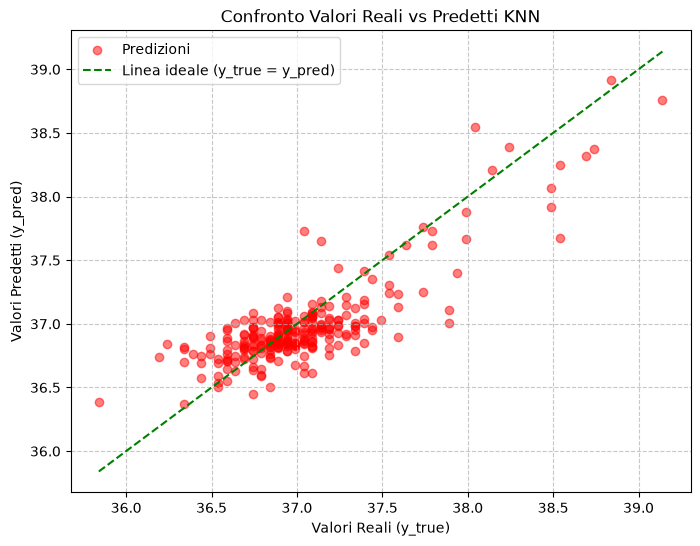

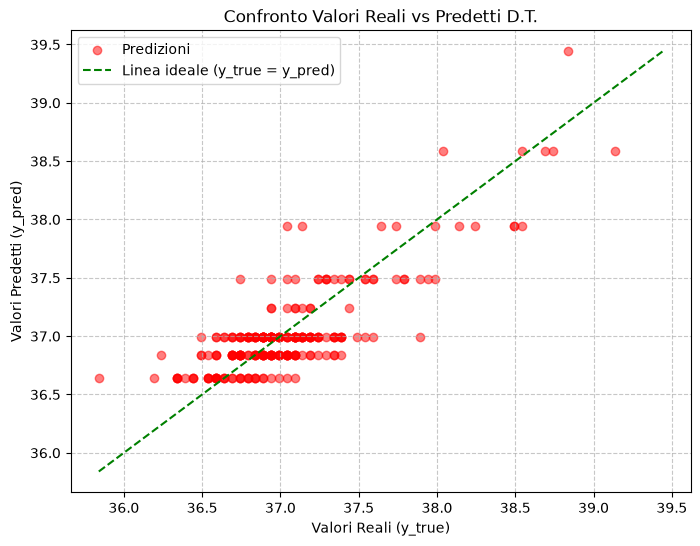

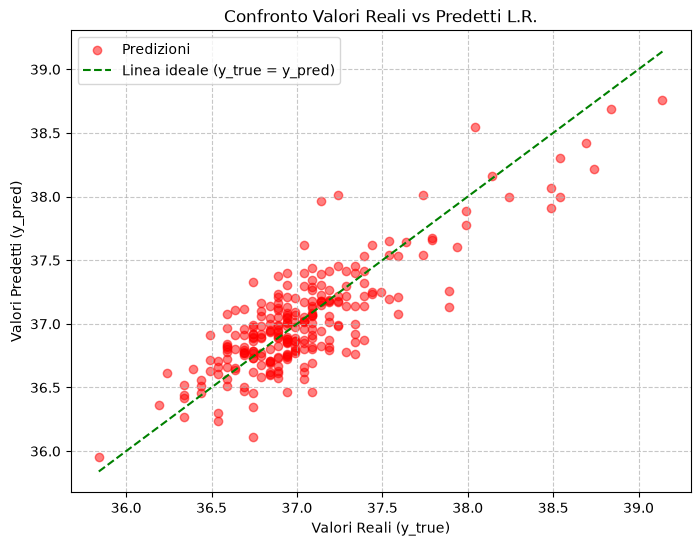

In [206]:
plot_risultati(y_test,y_pred_knn, "KNN")
plot_risultati(y_test,y_pred_dt, "D.T.")
plot_risultati(y_test,y_pred_lr, "L.R.")

Tra i tre modelli, nonostante le performance sulle metriche siano numericamente simili, i plot ci mostrano che il modello piu promettente è quello della regressione lineare:
- K-NN soffre i pochi dati nelle code della popolazione in cui non riesce a interpolare correttamente i dati
- Decision tree individua degli "scaglioni" di temperatura e risulterebbe sicuramente piu utile in una classificazione piuttosto che in regressione in cui, per performare con minore errore possibile, non riesce a fare dei bin granulari soddisfacenti sui dati
E' sembrato quindi logico proseguire lo studio andando a lavorare sul modello di regressione e sulle sue feature.

In [207]:
print(f"________________________RIDGE________________________________\n")
ridgeReg = RidgeCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000]).fit(X_train, y_train)
y_pred_R = ridgeReg.predict(X_test)

rmse_R = mean_squared_error(y_test, y_pred_R)**0.5
mae_R  = mean_absolute_error(y_test,y_pred_R)
r2_R   = r2_score(y_test, y_pred_R)
print(f"Alpha scelto da RidgeCV: {ridgeReg.alpha_}")
print(f"____________________________________________________________")
print(f"Coefficienti: {ridgeReg.coef_}")
print(f"Intercetta: {ridgeReg.intercept_}")
print(f"____________________________________________________________")
print(f"Test RMSE (DT): {rmse_R:.4f}")
print(f"Test MAE  (DT): {mae_R:.4f}")
print(f"Test R^2  (DT): {r2_R:.4f}")
print(f"Errore Quadratico Medio (MSE): {mean_squared_error(y_test, y_pred_R)}")

________________________RIDGE________________________________

Alpha scelto da RidgeCV: 10.0
____________________________________________________________
Coefficienti: [ 0.00850964  0.0307676   0.05835358 -0.0408166  -0.0062405  -0.02476653
 -0.08582417  0.0102683   0.0316792   0.0500475   0.02592144  0.03351518
 -0.07888789 -0.00261814 -0.0734327   0.02141075  0.01414004  0.0702114
  0.07390383  0.27358706  0.05977023]
Intercetta: 37.01644571009003
____________________________________________________________
Test RMSE (DT): 0.2506
Test MAE  (DT): 0.1957
Test R^2  (DT): 0.6986
Errore Quadratico Medio (MSE): 0.06278816777284936


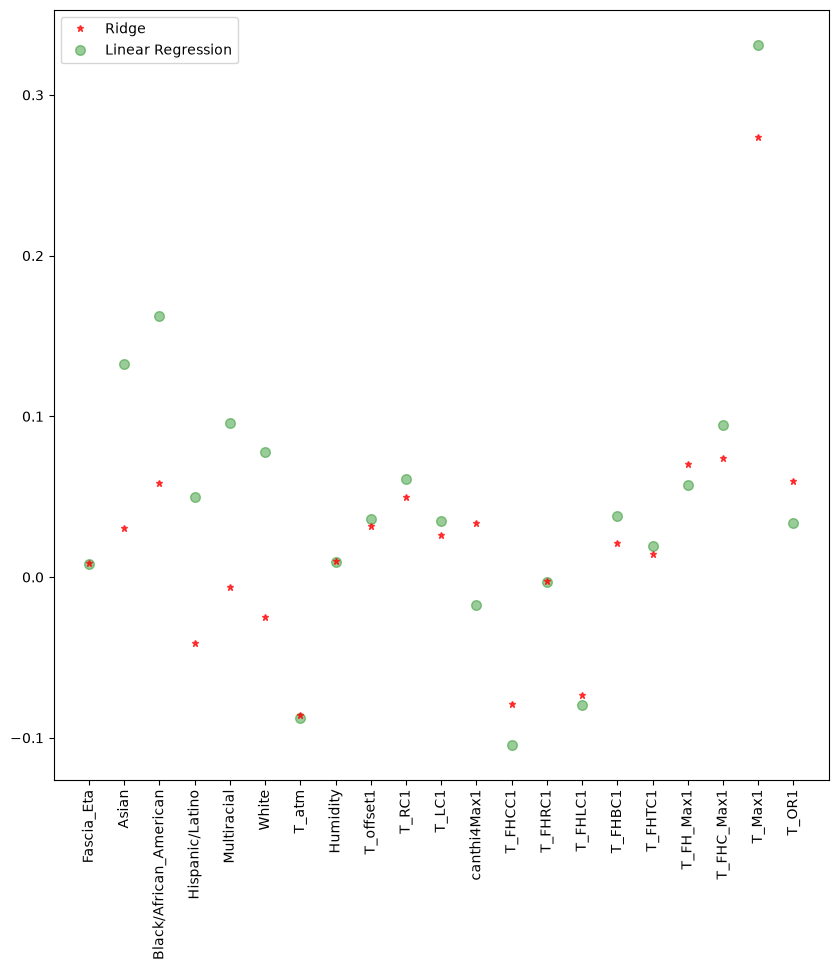

In [208]:
plt.figure(figsize = (10, 10))
plt.plot(X.columns[:],ridgeReg.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'Ridge',zorder=7)
plt.plot(X.columns[:],model_lr.coef_,alpha=0.4,linestyle='none',marker='o',markersize=7,color='green',label='Linear Regression')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

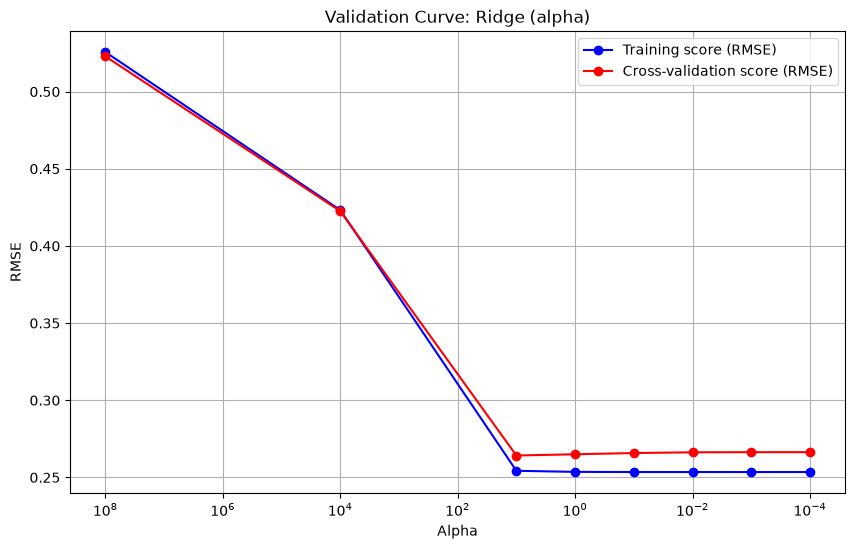

In [209]:
ridge = Ridge()

curvaValidazione(ridge, X_train, y_train, "alpha", [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000],"neg_mean_squared_error","Validation Curve: Ridge (alpha)","Alpha","RMSE",1,1)

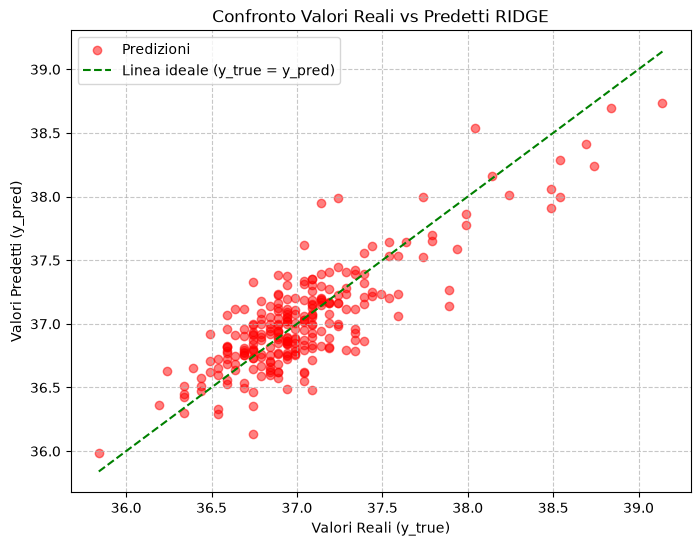

In [210]:
plot_risultati(y_test,y_pred_R, "RIDGE")

In [ ]:
print("_____________Lasso Model_____________\n")
lassoReg = LassoCV(alphas = [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000], random_state=0).fit(X_train, y_train)
lassoReg.fit(X_train,y_train)

y_pred_L=lassoReg.predict(X_test)

rmse_L = mean_squared_error(y_test, y_pred_L)**0.5
mae_L  = mean_absolute_error(y_test,y_pred_L)
r2_L   = r2_score(y_test, y_pred_L)
print(f"Alpha scelto da LassoCV: {lassoReg.alpha_}")
print(f"____________________________________________________________")
print(f"Coefficienti: {lassoReg.coef_}")
print(f"Intercetta: {lassoReg.intercept_}")
print(f"____________________________________________________________")
print(f"Test RMSE (DT): {rmse_L:.4f}")
print(f"Test MAE  (DT): {mae_L:.4f}")
print(f"Test R^2  (DT): {r2_L:.4f}")
print(f"Errore Quadratico Medio (MSE): {mean_squared_error(y_test, y_pred_L)}")

_____________Lasso Model_____________

Alpha scelto da RidgeCV: 0.001
____________________________________________________________
Coefficienti: [ 0.00797033  0.03697974  0.06395247 -0.02253339  0.         -0.01078875
 -0.08414475  0.00966944  0.03300767  0.05038617  0.0268808   0.
 -0.07420576  0.         -0.07052109  0.01756522  0.01154824  0.06025619
  0.07751615  0.33000832  0.03407388]
Intercetta: 37.00627340835635
____________________________________________________________
Test RMSE (DT): 0.2511
Test MAE  (DT): 0.1956
Test R^2  (DT): 0.6974
Errore Quadratico Medio (MSE): 0.0630498746757245


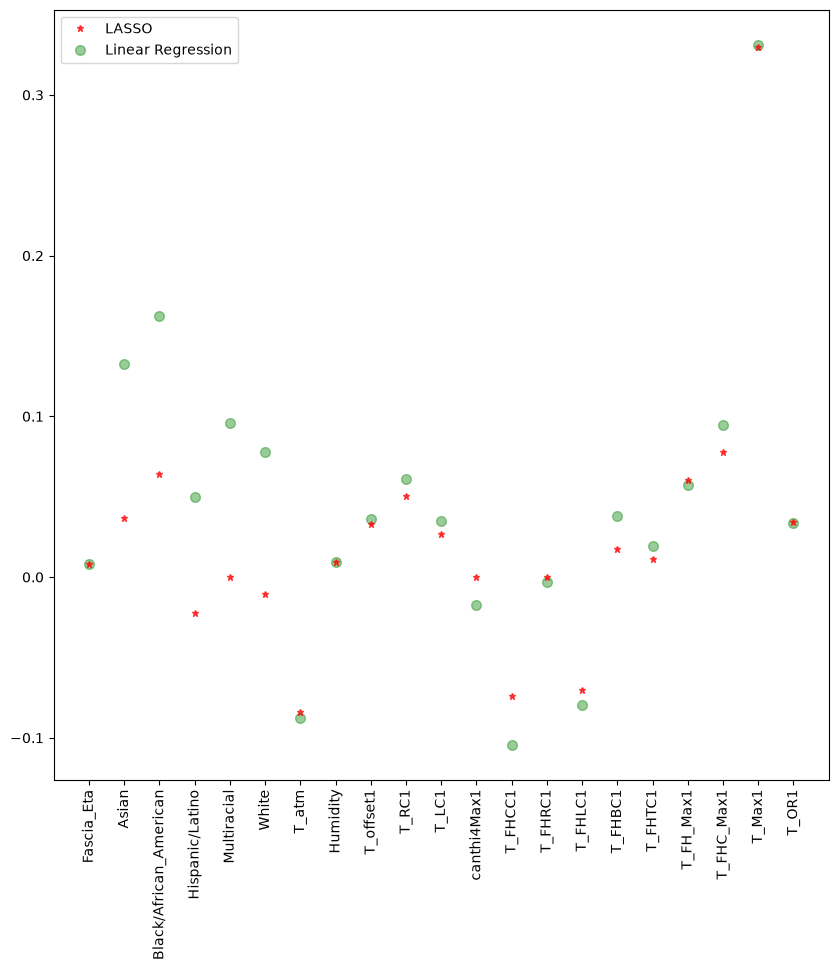

In [212]:
plt.figure(figsize = (10, 10))
plt.plot(X.columns[:],lassoReg.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'LASSO',zorder=7)
plt.plot(X.columns[:],model_lr.coef_,alpha=0.4,linestyle='none',marker='o',markersize=7,color='green',label='Linear Regression')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

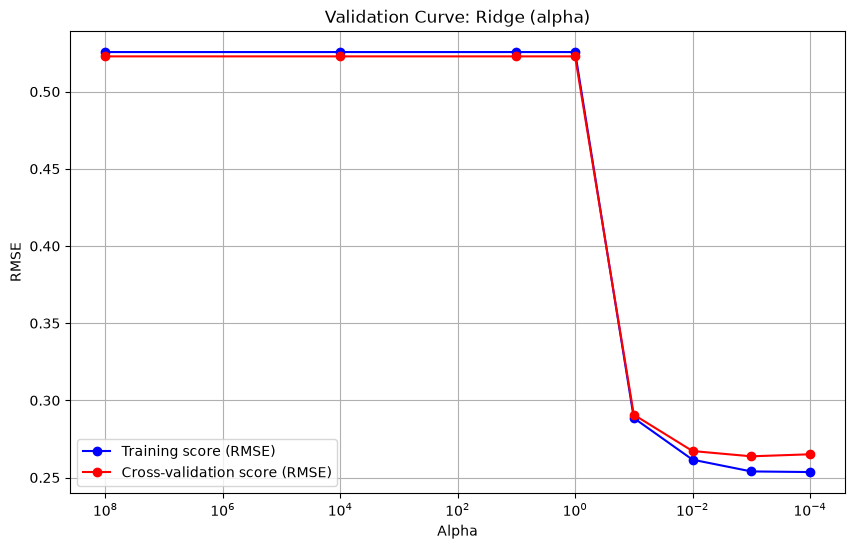

In [213]:
lasso = Lasso()

curvaValidazione(lasso, X_train, y_train, "alpha", [0.0001, 0.001,0.01, 0.1, 1, 10,10000,100000000],"neg_mean_squared_error","Validation Curve: Ridge (alpha)","Alpha","RMSE",1,1)

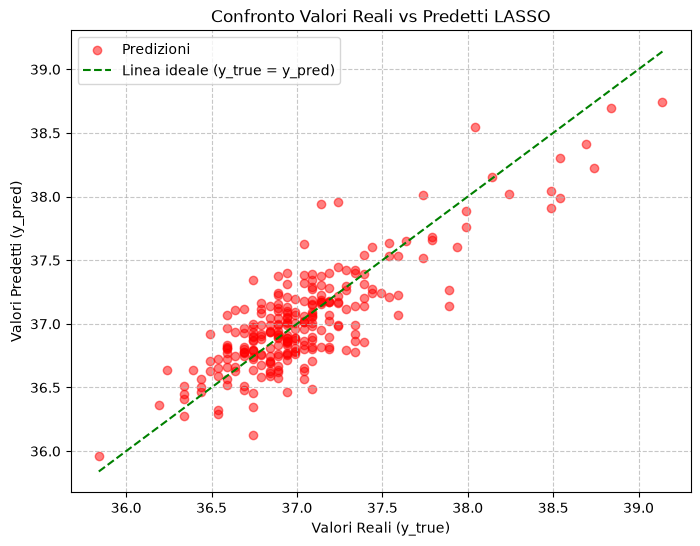

In [214]:
plot_risultati(y_test,y_pred_L, "LASSO")

I modelli si comportano meglio dopo ridge e lasso, cosa interessante è che, seppur molti coefficienti tendono a 0 con un ordine di grandezza in piu rispetto gli altri, nessuno viene azzerato e tutte le feature rimangono nei rispettivi modelli. Questo, evidentemente, è sinonimo del fatto che, nonostante la grande correlazione tra i dati, tutte le feature contribuiscono a livello informativo nella risposta.

## 4. PCA

A testimonianza di ciò si è prodotto anche un modello di regressione con PCA. Questo ha, tuttavia, solo scopo scientifico in quanto fa perdere al modello di spiegabilità essenziale in ambito medico.

In [215]:
pipeline = Pipeline([
    ('pca', PCA(n_components=0.95)),  # Mantiene il 95% della varianza
    ('regressore', LinearRegression())
])

# 2. Addestramento (fit) della pipeline
pipeline.fit(X_train, y_train)

# 3. Predizione
y_pred_PCA = pipeline.predict(X_test)

# 4. Metriche
rmse_PCA = mean_squared_error(y_test, y_pred_PCA)**0.5
mae_PCA  = mean_absolute_error(y_test, y_pred_PCA)
r2_PCA   = r2_score(y_test, y_pred_PCA)

# 5. Output
# Nota: i coefficienti ora si riferiscono alle componenti principali, non alle feature originali
print("_____________Lasso Model con PCA_____________\n")
print(f"____________________________________________________________")
print(f"Numero di componenti principali usate: {pipeline.named_steps['pca'].n_components_}")
print(f"Coefficienti (sulle componenti PCA): {pipeline.named_steps['regressore'].coef_}")
print(f"____________________________________________________________")
print(f"Test RMSE (PCA): {rmse_PCA:.4f}")
print(f"Test MAE  (PCA): {mae_PCA:.4f}")
print(f"Test R^2  (PCA): {r2_PCA:.4f}")


_____________Lasso Model con PCA_____________

____________________________________________________________
Numero di componenti principali usate: 10
Coefficienti (sulle componenti PCA): [ 0.11867163  0.17859875  0.01502782 -0.01311584  0.01918797  0.11349305
  0.10932773  0.00505091  0.05948242  0.0618097 ]
____________________________________________________________
Test RMSE (PCA): 0.2474
Test MAE  (PCA): 0.1939
Test R^2  (PCA): 0.7063


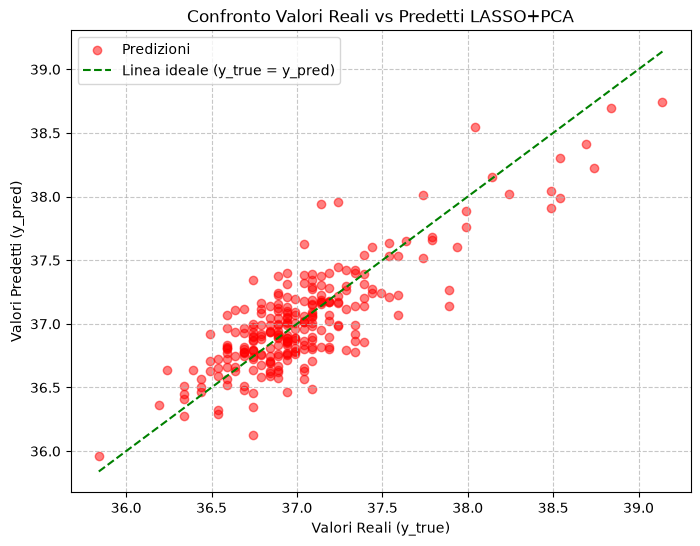

In [ ]:
plot_risultati(y_test,y_pred_PCA, "LASSO+PCA")

Come volevasi dimostrare, il modello si comporta praticamente nella stessa maniera dei regressori su dataset senza PCA.

## 5. NN

Con le NN si vuole vedere se si riesce ad intercettare ancora meglio eventuali non linearità del modello

In [217]:
class NNDropout(nn.Module):
    def __init__(self, dropout_rate=0.3):
        super().__init__()
        self.fc1 = nn.Linear(21, 50)
        self.bn1 = nn.BatchNorm1d(50)
        self.drop1 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(50, 1)

    def forward(self, x):
        x = torch.relu(self.bn1(self.fc1(x)))
        x = self.drop1(x)
        x = self.fc2(x)
        return x
    
model = NNDropout().to(device)
print(model)

NNDropout(
  (fc1): Linear(in_features=21, out_features=50, bias=True)
  (bn1): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
  (drop1): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=50, out_features=1, bias=True)
)


In [218]:
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4,
    weight_decay=0
)

In [219]:
criterion = nn.HuberLoss()
num_epochs = 10000
train_loss_history = []
test_loss_history = []

In [220]:
X_train = df.iloc[:, :-1].values
y_train = df.iloc[:, -1].values
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
dataset_train = TensorDataset(X_train, y_train)
X_test = df.iloc[:, :-1].values
y_test = df.iloc[:, -1].values
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)
dataset_test = TensorDataset(X_test, y_test)

train_loader = DataLoader(dataset_train, batch_size=256, shuffle=True)
test_loader = DataLoader(dataset_test, batch_size=256, shuffle=False)


In [221]:
best_test_loss = float('inf')

for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0

    for datas, labels in train_loader:
        datas = datas.to(device)
        labels = labels.to(device)
        labels = labels.view(-1, 1)

        optimizer.zero_grad()
        outputs = model(datas)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)
    train_loss_history.append(avg_train_loss)

    
    model.eval()
    running_test_loss = 0.0

    with torch.no_grad():  # niente gradienti in valutazione
        for datas, labels in test_loader:
            datas = datas.to(device)
            labels = labels.to(device)
            labels = labels.view(-1, 1)
            outputs = model(datas)
            loss = criterion(outputs, labels)   # loss, ma su dati indipendenti
            running_test_loss += loss.item()

    avg_test_loss = running_test_loss / len(test_loader)
    test_loss_history.append(avg_test_loss)

    print(f"Epoch {epoch+1}/{num_epochs} - "
          f"train_loss: {avg_train_loss:.4f} - test_loss: {avg_test_loss:.4f}")
    
    if avg_test_loss < best_test_loss:
        best_test_loss = avg_test_loss
        torch.save(model.state_dict(), 'best_model.pth')


Epoch 1/10000 - train_loss: 35.9775 - test_loss: 28.0517
Epoch 2/10000 - train_loss: 35.9657 - test_loss: 30.8544
Epoch 3/10000 - train_loss: 35.9654 - test_loss: 32.5888
Epoch 4/10000 - train_loss: 35.9445 - test_loss: 33.7633
Epoch 5/10000 - train_loss: 35.9469 - test_loss: 34.5701
Epoch 6/10000 - train_loss: 35.9445 - test_loss: 35.1123
Epoch 7/10000 - train_loss: 35.9353 - test_loss: 35.4588
Epoch 8/10000 - train_loss: 35.9126 - test_loss: 35.6569
Epoch 9/10000 - train_loss: 35.9073 - test_loss: 35.7679
Epoch 10/10000 - train_loss: 35.8897 - test_loss: 35.8138
Epoch 11/10000 - train_loss: 35.8938 - test_loss: 35.8219
Epoch 12/10000 - train_loss: 35.8718 - test_loss: 35.8166
Epoch 13/10000 - train_loss: 35.8674 - test_loss: 35.8155
Epoch 14/10000 - train_loss: 35.8559 - test_loss: 35.8141
Epoch 15/10000 - train_loss: 35.8391 - test_loss: 35.8117
Epoch 16/10000 - train_loss: 35.8305 - test_loss: 35.8061
Epoch 17/10000 - train_loss: 35.8174 - test_loss: 35.8120
Epoch 18/10000 - train_

/tmp/ipykernel_5661/1470898575.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


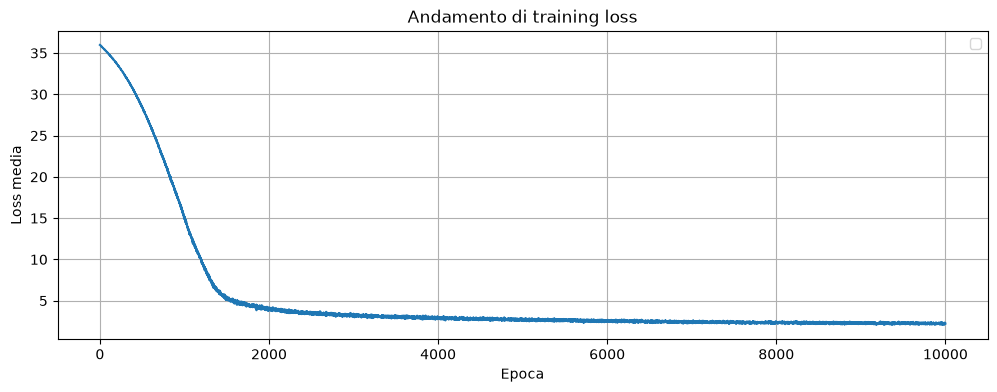

/tmp/ipykernel_5661/1470898575.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


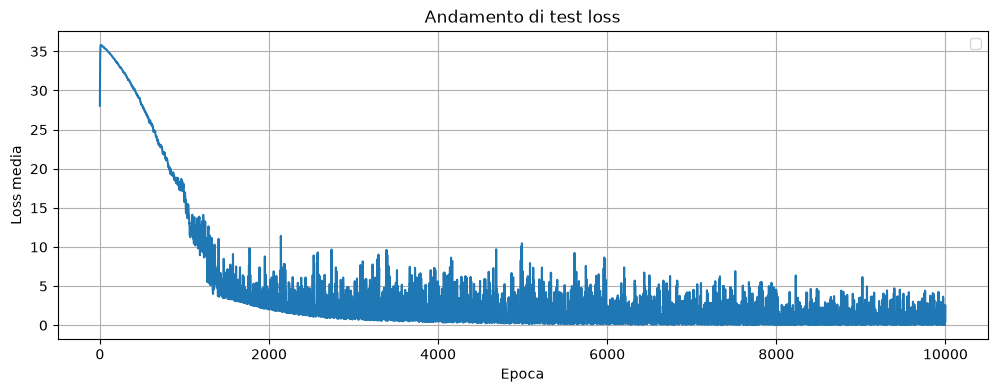

In [222]:
plt.figure(figsize=(12, 4))
plt.plot(train_loss_history)
plt.xlabel("Epoca")
plt.ylabel("Loss media")
plt.title("Andamento di training loss")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(test_loss_history)
plt.xlabel("Epoca")
plt.ylabel("Loss media")
plt.title("Andamento di test loss")
plt.legend()
plt.grid(True)
plt.show()

In [223]:
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

y_preds = []
y_trues = []

with torch.no_grad():
    for datas, labels in test_loader:
        datas = datas.to(device)
        outputs = model(datas)
        y_preds.append(outputs.cpu().numpy())
        y_trues.append(labels.cpu().numpy())

y_pred_NN = np.vstack(y_preds).flatten()
y_test = np.concatenate(y_trues).flatten()

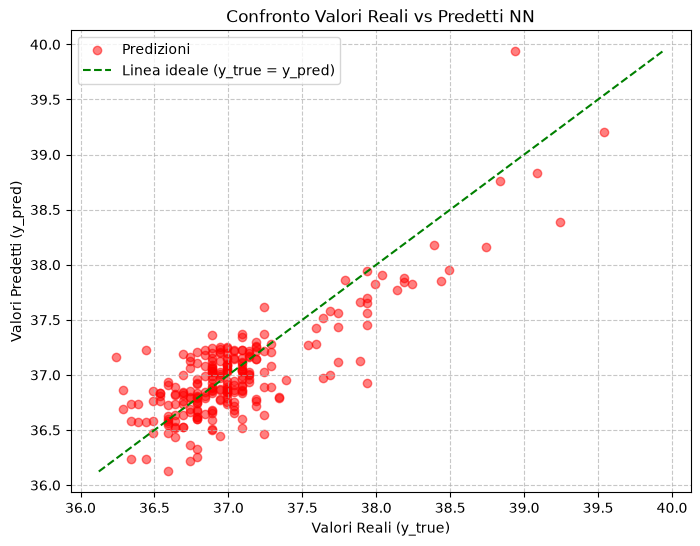

In [224]:
y_test = labels.detach().cpu().numpy()
y_pred_NN = outputs.detach().cpu().numpy()
plot_risultati(y_test,y_pred_NN, "NN")

In [225]:
print(y)
risultato = y.index[y ==38.84]
print(risultato)
print(X.iloc[261])
print(X.iloc[688])
print(X.iloc[800])

0       36.59
1       37.19
2       37.34
3       37.09
4       37.04
        ...  
1015    36.99
1016    37.19
1017    37.59
1018    37.29
1019    37.19
Name: aveOralM, Length: 1018, dtype: float64
Index([261, 688, 800], dtype='int64')
Fascia_Eta                0.000000
Asian                     0.000000
Black/African_American    0.000000
Hispanic/Latino           0.000000
Multiracial               0.000000
White                     1.000000
T_atm                     1.035323
Humidity                 -0.248721
T_offset1                 0.333650
T_RC1                     3.424284
T_LC1                     4.149353
canthi4Max1               3.990783
T_FHCC1                   2.995503
T_FHRC1                   2.412370
T_FHLC1                   2.035870
T_FHBC1                   3.011648
T_FHTC1                   2.516075
T_FH_Max1                 3.568415
T_FHC_Max1                2.804431
T_Max1                    3.776236
T_OR1                     2.845989
Name: 261, dtype: float64
Fa

FORSE ERRORE DOVUTO A UMIDITA

In [ ]:
rmse_NN = mean_squared_error(y_test, y_pred_NN)**0.5
mae_NN  = mean_absolute_error(y_test, y_pred_NN)
r2_NN   = r2_score(y_test, y_pred_NN)
errore_massimo_NN = max_error(y_test, y_pred_NN)

print("_____________ NN _____________\n")
print(f"Test RMSE (NN): {rmse_NN:.4f}")
print(f"Test MAE  (NN): {mae_NN:.4f}")
print(f"Test R^2  (NN): {r2_NN:.4f}")
print(f"MAX ERROR  (NN): {errore_massimo_NN:.4f}")


_____________ NN _____________

Test RMSE (NN): 0.2893
Test MAE  (NN): 0.2193
Test R^2  (NN): 0.6796
MAX ERROR  (NN): 0.6796


# CONCLUSIONI

In [227]:

# Confronto aggregato di tutti i modelli
results_comparison = pd.DataFrame({
    'Modello': ['K-NN', 'Decision Tree', 'Linear Reg', 'Ridge', 'Lasso', 'PCA+Linear', 'NN'],
    'RMSE': [rmse_knn, rmse_dt, rmse_lr, rmse_R, rmse_L, rmse_L, rmse_NN],  # NN value sarà aggiornato
    'MAE': [mae_knn, mae_dt, mae_lr, mae_R, mae_L, mae_L, mae_NN],
    'R²': [r2_knn, r2_dt, r2_lr, r2_R, r2_L, r2_L, r2_NN]
})

print("="*80)
print("CONFRONTO PERFORMANCE MODELLI")
print("="*80)
print(results_comparison.to_string(index=False))
print("="*80)


CONFRONTO PERFORMANCE MODELLI
      Modello     RMSE      MAE       R²
         K-NN 0.252910 0.191029 0.693002
Decision Tree 0.263647 0.203137 0.666382
   Linear Reg 0.253325 0.197425 0.691994
        Ridge 0.250576 0.195709 0.698643
        Lasso 0.251097 0.195559 0.697387
   PCA+Linear 0.251097 0.195559 0.697387
           NN 0.289307 0.219298 0.679556


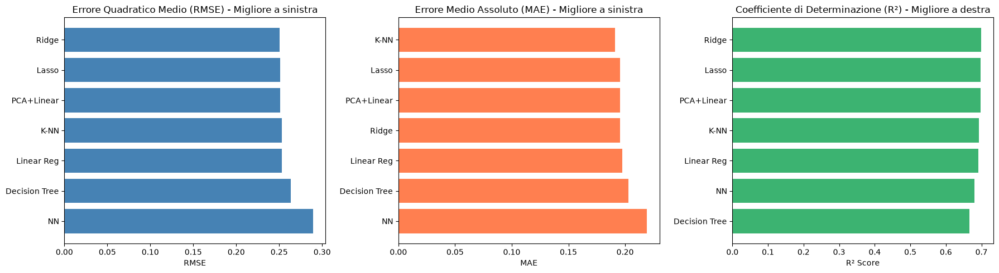


____________ RANKING PER METRICA ____________

Migliore RMSE: Ridge (0.2506)
Migliore MAE: K-NN (0.1910)
Migliore R^2: Ridge (0.6986)


In [228]:

# Visualizzazione comparativa delle performance
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# RMSE comparison
results_rmse = results_comparison.sort_values('RMSE')
axes[0].barh(results_rmse['Modello'], results_rmse['RMSE'], color='steelblue')
axes[0].set_xlabel('RMSE')
axes[0].set_title('Errore Quadratico Medio (RMSE) - Migliore a sinistra')
axes[0].invert_yaxis()

# MAE comparison
results_mae = results_comparison.sort_values('MAE')
axes[1].barh(results_mae['Modello'], results_mae['MAE'], color='coral')
axes[1].set_xlabel('MAE')
axes[1].set_title('Errore Medio Assoluto (MAE) - Migliore a sinistra')
axes[1].invert_yaxis()

# R² comparison
results_r2 = results_comparison.sort_values('R²', ascending=False)
axes[2].barh(results_r2['Modello'], results_r2['R²'], color='mediumseagreen')
axes[2].set_xlabel('R² Score')
axes[2].set_title('Coefficiente di Determinazione (R²) - Migliore a destra')
axes[2].invert_yaxis()

plt.tight_layout()
plt.show()

print("\n____________ RANKING PER METRICA ____________")
print(f"\nMigliore RMSE: {results_rmse['Modello'].iloc[0]} ({results_rmse['RMSE'].iloc[0]:.4f})")
print(f"Migliore MAE: {results_mae['Modello'].iloc[0]} ({results_mae['MAE'].iloc[0]:.4f})")
print(f"Migliore R^2: {results_r2['Modello'].iloc[0]} ({results_r2['R²'].iloc[0]:.4f})")


## Analisi dei Residui - Diagnostica della NN

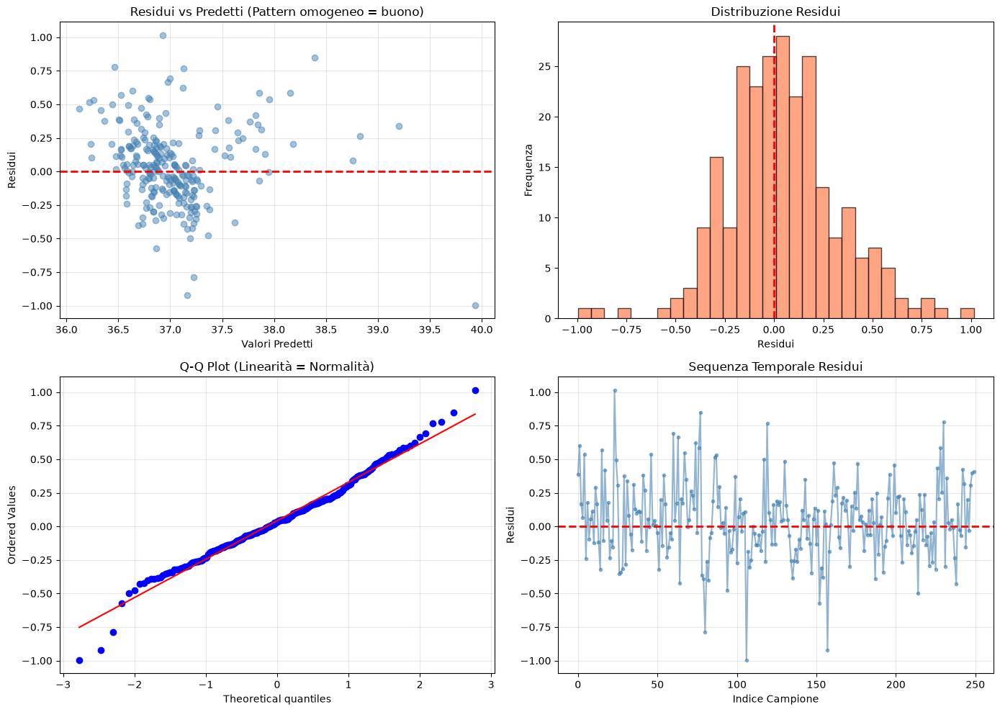


ANALISI RESIDUI
Media residui: 0.041951
Std residui: 0.2862
Min residuo: -0.9954
Max residuo: 1.0139
Skewness: 0.0883
Kurtosis: 1.1386


In [232]:

# Analisi residui della NN
residuals_nn = y_test - y_pred_NN.flatten()

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Residuals vs Predicted
axes[0, 0].scatter(y_pred_NN, residuals_nn, alpha=0.5, color='steelblue')
axes[0, 0].axhline(0, color='red', linestyle='--', linewidth=2)
axes[0, 0].set_xlabel('Valori Predetti')
axes[0, 0].set_ylabel('Residui')
axes[0, 0].set_title('Residui vs Predetti (Pattern omogeneo = buono)')
axes[0, 0].grid(True, alpha=0.3)

# 2. Distribuzione dei residui
axes[0, 1].hist(residuals_nn, bins=30, edgecolor='black', color='coral', alpha=0.7)
axes[0, 1].set_xlabel('Residui')
axes[0, 1].set_ylabel('Frequenza')
axes[0, 1].set_title('Distribuzione Residui') #GAUSSIANO = BUONO
axes[0, 1].axvline(0, color='red', linestyle='--', linewidth=2)

# 3. Q-Q plot
from scipy import stats
stats.probplot(residuals_nn, dist="norm", plot=axes[1, 0])
axes[1, 0].set_title('Q-Q Plot (Linearità = Normalità)')
axes[1, 0].grid(True, alpha=0.3)

# 4. Residui nel tempo (sequenza di predizioni)
axes[1, 1].plot(residuals_nn, marker='o', alpha=0.6, markersize=3, color='steelblue')
axes[1, 1].axhline(0, color='red', linestyle='--', linewidth=2)
axes[1, 1].set_xlabel('Indice Campione')
axes[1, 1].set_ylabel('Residui')
axes[1, 1].set_title('Sequenza Temporale Residui')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Statistiche residui
print("\nANALISI RESIDUI")
print(f"Media residui: {residuals_nn.mean():.6f}") #dovrebbe TENDERE A 0
print(f"Std residui: {residuals_nn.std():.4f}")
print(f"Min residuo: {residuals_nn.min():.4f}")
print(f"Max residuo: {residuals_nn.max():.4f}")
print(f"Skewness: {stats.skew(residuals_nn):.4f}") #(0 = simmetrico)
print(f"Kurtosis: {stats.kurtosis(residuals_nn):.4f}") #(0 = gaussiano
